# Wildfire Prediction

## Introduction
The following report attempts to apply Time Series and Machine Learning models to a given set of variables in order to predict the possibility of a wildfire occurring. In doing so, the project first attempts to predict the Fire Risk Index, accounting for the data of environmental variables in the process, using an accurate time series model. After that, the project proceeds on its primary object of predicting the binary Fire Occurrence (1: Occurrence and 0: No Occurrence) variable by using the forecasted Index values along with classification models.

## Import Packages

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import het_arch
!pip3 install arch
from arch import arch_model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score
from sklearn.ensemble import RandomForestClassifier

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 985.3/985.3 kB 10.2 MB/s eta 0:00:00


In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
file_path = '/content/synthetic_wildfire_data.csv'
df = pd.read_csv(file_path)

df['Date'] = pd.to_datetime(df['Date'])

df.set_index('Date', inplace=True)

print("Null values",df.isnull().sum().sum())
print(df.columns)
print(df.shape)
print(df.head)

Null values 0
Index(['Temperature', 'Humidity', 'Wind_Speed', 'Precipitation',
       'Vegetation_Type', 'Fire_Risk_Index', 'Fire_Occurrence'],
      dtype='object')
(9132, 7)
<bound method NDFrame.head of             Temperature  Humidity  Wind_Speed  Precipitation Vegetation_Type  \
Date                                                                           
2000-01-01        24.07     41.91       49.53          17.00       Shrubland   
2000-01-02        36.36     28.08       16.30           4.72         Wetland   
2000-01-03        16.07     21.89       23.26          19.12       Shrubland   
2000-01-04        37.37     71.49       22.35           1.73          Forest   
2000-01-05        34.07     69.72       11.56          22.08          Forest   
...                 ...       ...         ...            ...             ...   
2024-12-27        21.30     88.77       35.57          10.05          Forest   
2024-12-28        18.42     87.17        4.71          22.26         Wetla

##Exploratory Data Analysis
### *Data*
The dataset contains 9,132 rows and 7 columns and includes the following variables: Temperature, Humidity, Wind Speed, Precipitation, Vegetation Type, Fire Risk Index, and the binary target variable Fire Occurrence. A check for missing values showed continuous data with no null values in the dataset  


### *Intitial Visualisations*
An initial plotting of each variable over the given time period, for a visual inspection of stationarity, indicated data with consistent fluctuations and no trends or seasonal patterns.

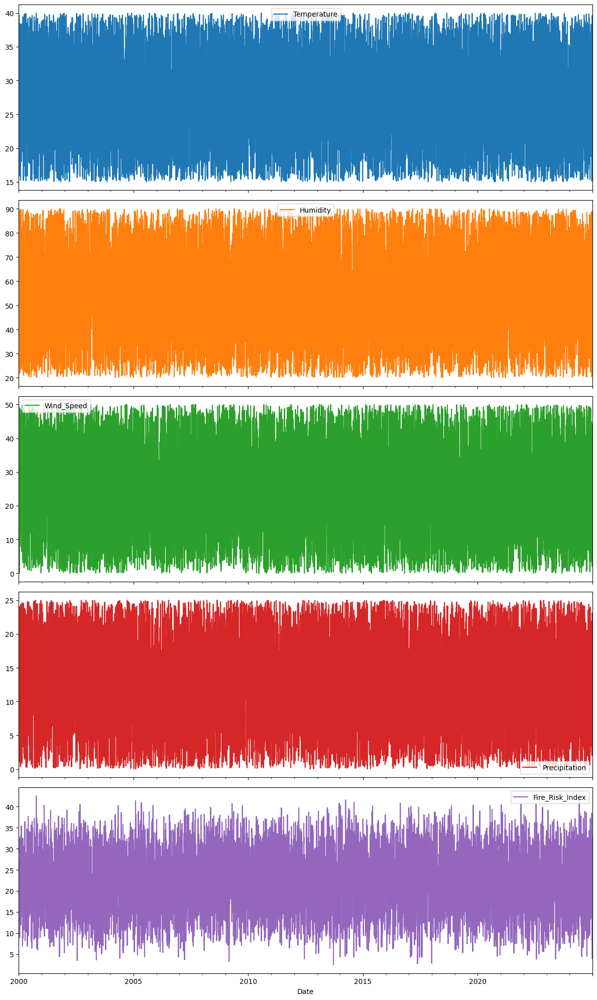

In [ ]:
df[['Temperature', 'Humidity', 'Wind_Speed', 'Precipitation', 'Fire_Risk_Index']].plot(subplots=True, figsize=(12, 20))
plt.tight_layout()
plt.show()

### *Visualization of data by Vegetation Type*

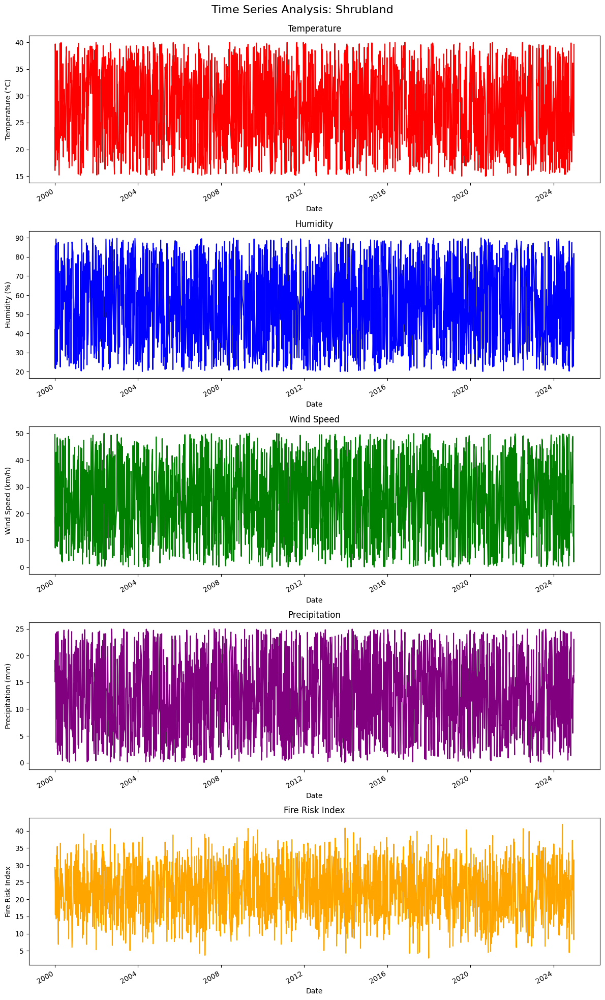

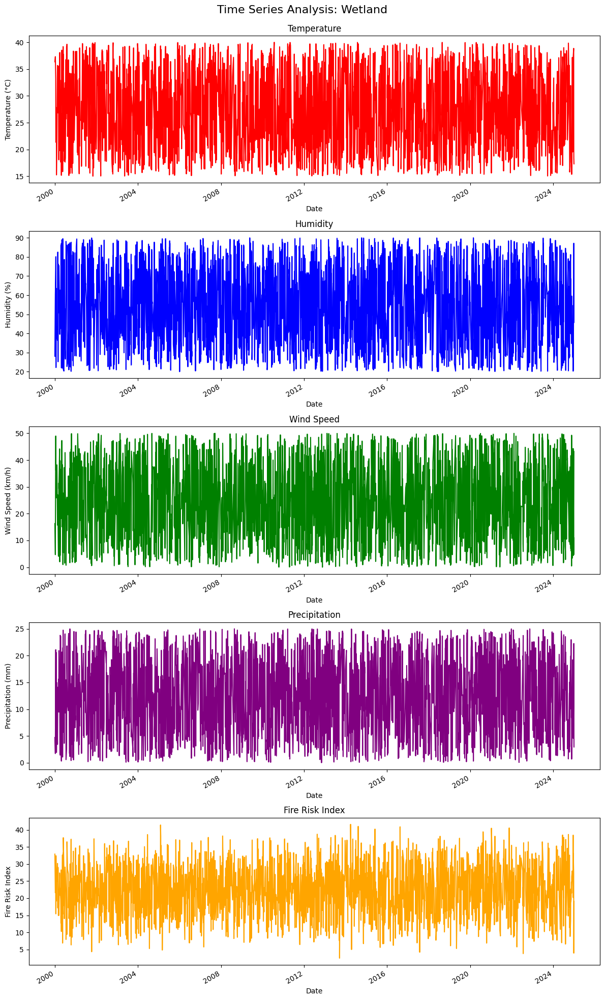

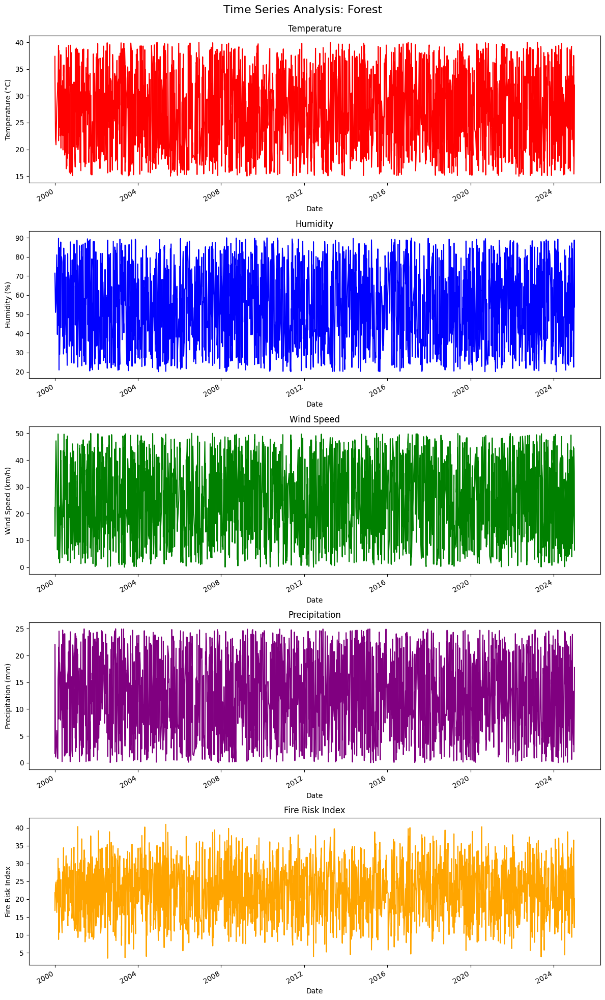

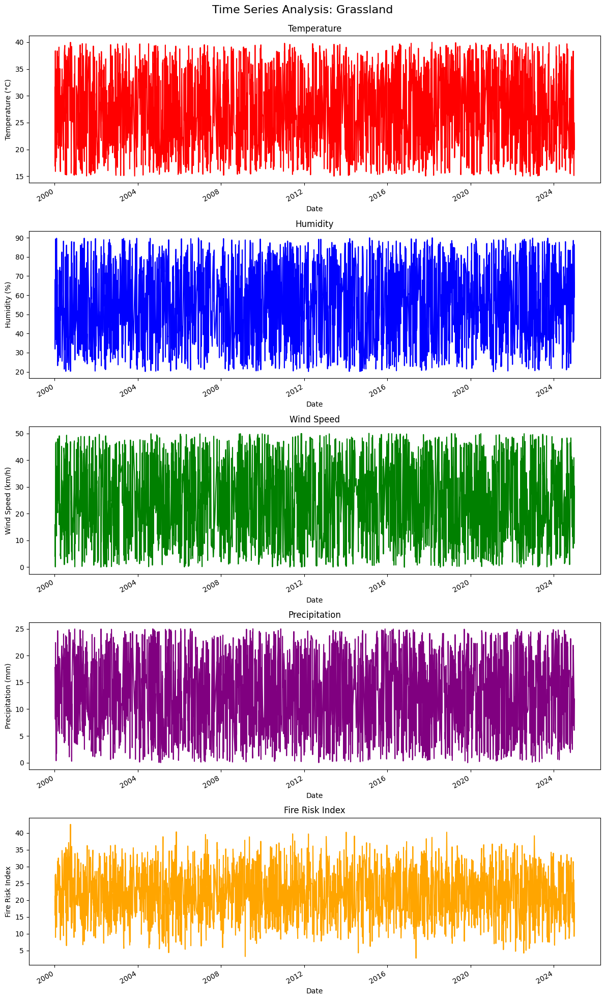

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Get unique vegetation types
vegetation_types = df['Vegetation_Type'].unique()

# Create separate plots for each vegetation type
for veg_type in vegetation_types:
    # Filter data for this vegetation type
    veg_data = df[df['Vegetation_Type'] == veg_type]

    # Create plot with subplots
    fig, axes = plt.subplots(5, 1, figsize=(12, 20))
    fig.suptitle(f'Time Series Analysis: {veg_type}', fontsize=16)

    # Plot each feature
    veg_data['Temperature'].plot(ax=axes[0], color='red')
    axes[0].set_ylabel('Temperature (°C)')
    axes[0].set_title('Temperature')

    veg_data['Humidity'].plot(ax=axes[1], color='blue')
    axes[1].set_ylabel('Humidity (%)')
    axes[1].set_title('Humidity')

    veg_data['Wind_Speed'].plot(ax=axes[2], color='green')
    axes[2].set_ylabel('Wind Speed (km/h)')
    axes[2].set_title('Wind Speed')

    veg_data['Precipitation'].plot(ax=axes[3], color='purple')
    axes[3].set_ylabel('Precipitation (mm)')
    axes[3].set_title('Precipitation')

    veg_data['Fire_Risk_Index'].plot(ax=axes[4], color='orange')
    axes[4].set_ylabel('Fire Risk Index')
    axes[4].set_title('Fire Risk Index')



    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()

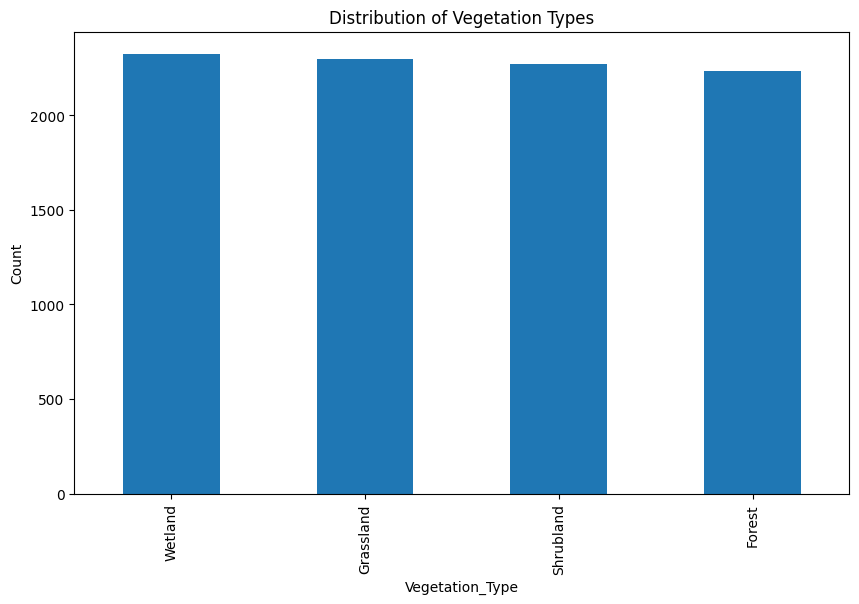

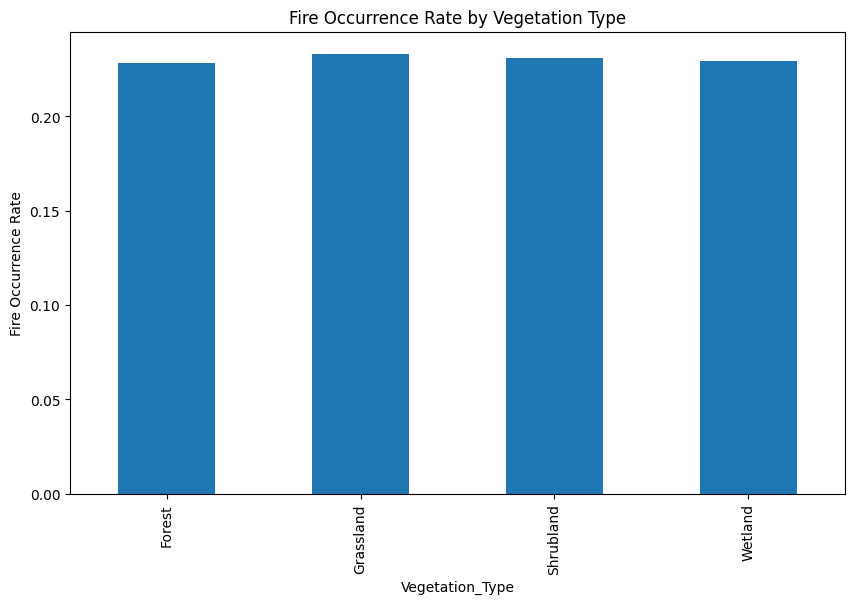

In [ ]:
veg_counts = df['Vegetation_Type'].value_counts()
plt.figure(figsize=(10, 6))
veg_counts.plot(kind='bar')
plt.title('Distribution of Vegetation Types')
plt.ylabel('Count')
plt.show()

# Analyzing fire occurrence by vegetation type
fire_by_veg = df.groupby('Vegetation_Type')['Fire_Occurrence'].mean()
plt.figure(figsize=(10, 6))
fire_by_veg.plot(kind='bar')
plt.title('Fire Occurrence Rate by Vegetation Type')
plt.ylabel('Fire Occurrence Rate')
plt.show()

The data was also separated on the categorical variable of Vegetation Type (i.e., Forest, Shrubland, Grassland, and Wetland) and plotting the time series for each of the five continuous variables individually. The results for each type are similar to the figure below, reflecting relatively stationary series for the Grassland type.

### *Testing for Stationarity*

To determine the suitability of our time series data for statistical modeling, we conducted stationarity tests using the Augmented Dickey-Fuller (ADF) test. This test helps us evaluate whether a time series is stationary—i.e., its statistical properties (mean, variance, autocorrelation, etc.) remain constant over time. The null hypothesis H0 assumes that the series is non-stationary, and a p-value less than 0.05 indicates we can reject the null and conclude that the series is stationary.


In [ ]:
def check_stationarity(series, title):

    print(f"Stationarity Tests for {title}")

    # ADF Test
    result = adfuller(series.dropna())
    print(f'ADF Statistic: {result[0]:.4f}')
    print(f'p-value: {result[1]:.4f}')
    print(f'Critical Values: {result[4]}')
    if result[1] <= 0.05:
        print("=> Series is stationary")
    else:
        print("=> Series is non-stationary")


check_stationarity(df['Fire_Risk_Index'], 'Fire Risk Index')
check_stationarity(df['Temperature'], 'Temperature')
check_stationarity(df['Humidity'], 'Humidity')
check_stationarity(df['Wind_Speed'], 'Wind Speed')
check_stationarity(df['Precipitation'], 'Precipitation')

Stationarity Tests for Fire Risk Index
ADF Statistic: -96.2696
p-value: 0.0000
Critical Values: {'1%': np.float64(-3.431066366148897), '5%': np.float64(-2.86185658790662), '10%': np.float64(-2.566938514689885)}
=> Series is stationary
Stationarity Tests for Temperature
ADF Statistic: -95.9440
p-value: 0.0000
Critical Values: {'1%': np.float64(-3.431066366148897), '5%': np.float64(-2.86185658790662), '10%': np.float64(-2.566938514689885)}
=> Series is stationary
Stationarity Tests for Humidity
ADF Statistic: -94.4707
p-value: 0.0000
Critical Values: {'1%': np.float64(-3.431066366148897), '5%': np.float64(-2.86185658790662), '10%': np.float64(-2.566938514689885)}
=> Series is stationary
Stationarity Tests for Wind Speed
ADF Statistic: -97.5547
p-value: 0.0000
Critical Values: {'1%': np.float64(-3.431066366148897), '5%': np.float64(-2.86185658790662), '10%': np.float64(-2.566938514689885)}
=> Series is stationary
Stationarity Tests for Precipitation
ADF Statistic: -96.2131
p-value: 0.0000

The results above show that all variables are stationary. However, the data was also separated on the categorical variable of Vegetation Type (i.e., Forest, Shrubland, Grassland, and Wetland) and plotting the time series for each of the five continuous variables individually.

### *Testing for stationarity by Vegetation Type*

All p-values are significantly below 0.05, allowing us to reject the null hypothesis of non-stationarity for all variables. The ADF statistics are much lower than the critical values at all confidence levels (1%, 5%, 10%), which reinforces the conclusion of strong stationarity.


In [ ]:
from statsmodels.tsa.stattools import adfuller
import pandas as pd

def check_stationarity(series, title):
    print(f"Stationarity Tests for {title}")

    # ADF Test
    result = adfuller(series.dropna())
    print(f'ADF Statistic: {result[0]:.6f}')
    print(f'p-value: {result[1]:.6f}')
    print(f'Critical Values: {result[4]}')
    if result[1] <= 0.05:
        print("=> Series is stationary")
    else:
        print("=> Series is non-stationary")
    print("\n")  # Add some space between tests

# Get unique vegetation types
vegetation_types = df['Vegetation_Type'].unique()

# For each vegetation type
for veg_type in vegetation_types:
    print(f"\n{'='*50}")
    print(f"VEGETATION TYPE: {veg_type}")
    print(f"{'='*50}\n")

    # Filter data for this vegetation type
    veg_data = df[df['Vegetation_Type'] == veg_type]

    # Check stationarity for each variable
    check_stationarity(veg_data['Fire_Risk_Index'], f'Fire Risk Index - {veg_type}')
    check_stationarity(veg_data['Temperature'], f'Temperature - {veg_type}')
    check_stationarity(veg_data['Humidity'], f'Humidity - {veg_type}')
    check_stationarity(veg_data['Wind_Speed'], f'Wind Speed - {veg_type}')
    check_stationarity(veg_data['Precipitation'], f'Precipitation - {veg_type}')


VEGETATION TYPE: Shrubland

Stationarity Tests for Fire Risk Index - Shrubland
ADF Statistic: -48.343660
p-value: 0.000000
Critical Values: {'1%': np.float64(-3.433235285765301), '5%': np.float64(-2.862814646891805), '10%': np.float64(-2.5674485535435454)}
=> Series is stationary


Stationarity Tests for Temperature - Shrubland
ADF Statistic: -46.880996
p-value: 0.000000
Critical Values: {'1%': np.float64(-3.433235285765301), '5%': np.float64(-2.862814646891805), '10%': np.float64(-2.5674485535435454)}
=> Series is stationary


Stationarity Tests for Humidity - Shrubland
ADF Statistic: -47.298587
p-value: 0.000000
Critical Values: {'1%': np.float64(-3.433235285765301), '5%': np.float64(-2.862814646891805), '10%': np.float64(-2.5674485535435454)}
=> Series is stationary


Stationarity Tests for Wind Speed - Shrubland
ADF Statistic: -18.777678
p-value: 0.000000
Critical Values: {'1%': np.float64(-3.4332416651095277), '5%': np.float64(-2.862817463760144), '10%': np.float64(-2.56745005332

### *Decomposition Analysis*

A decomposition analysis was performed on environmental variables across different vegetation types. The purpose was to break down each time series into its trend, seasonal, and residual components, which aids in understanding the underlying patterns. Each series was decomposed and checked for various periods such as 30, 60, 90, 120 and 365 days. Apart from yearly seasonality and certain variations in the residuals, no other specific patterns can be elicited. The former could likely be influenced by seasons and weather cycles.


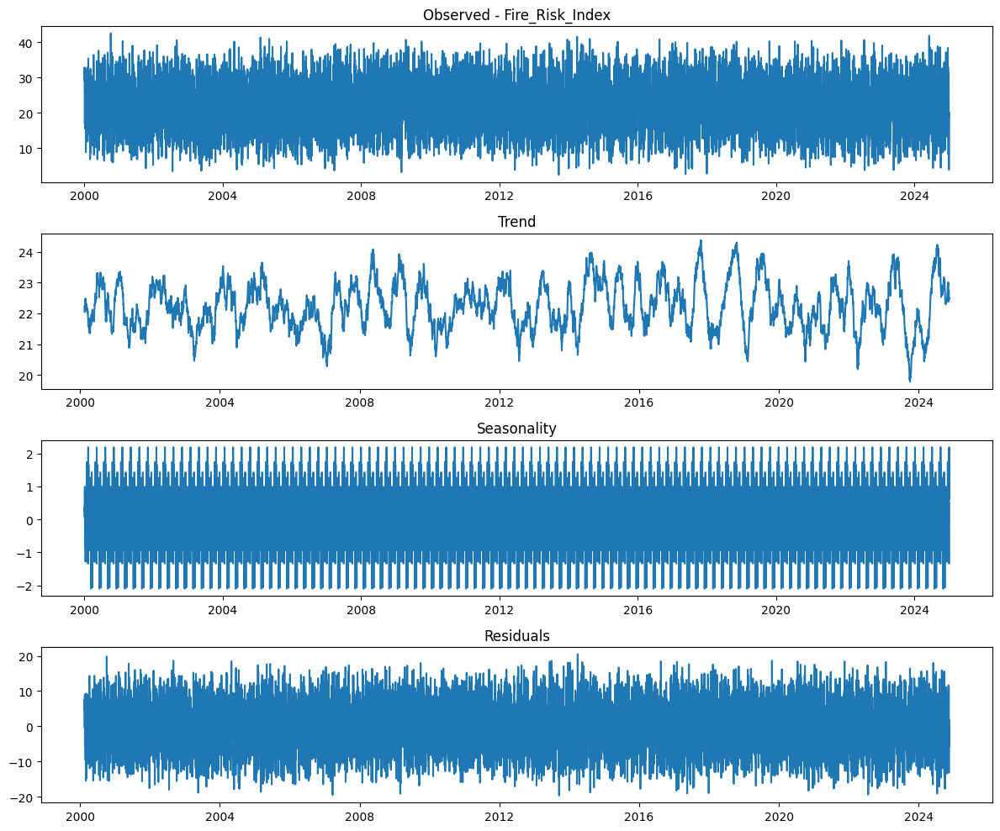

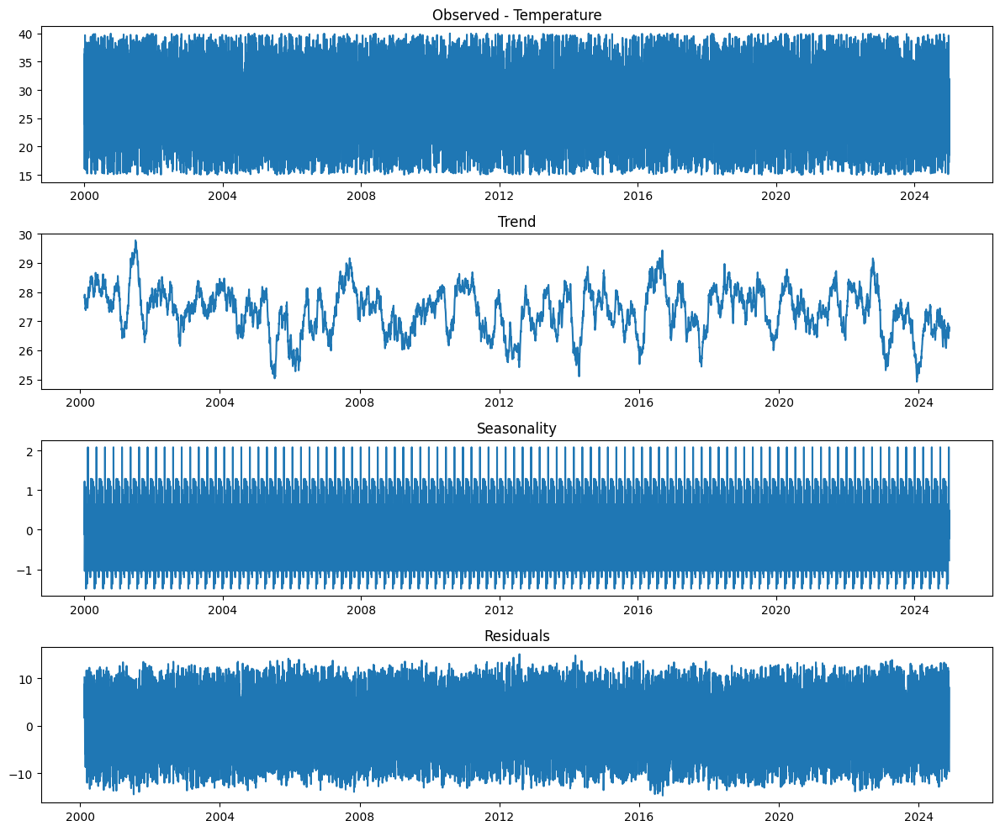

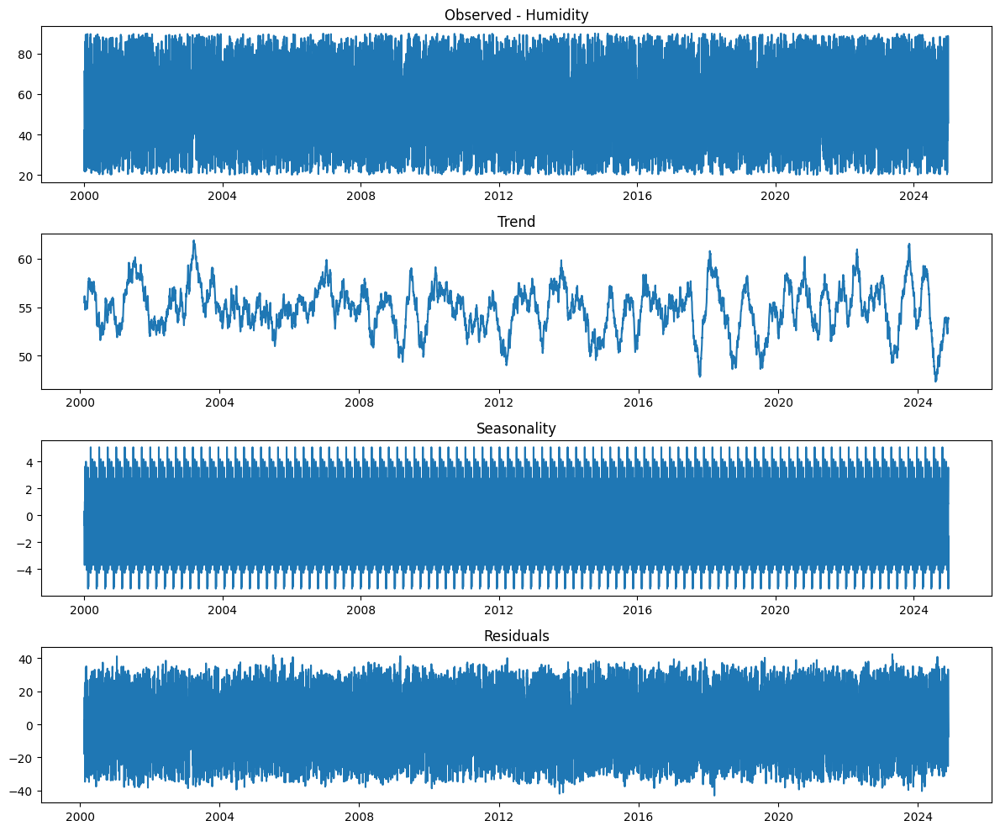

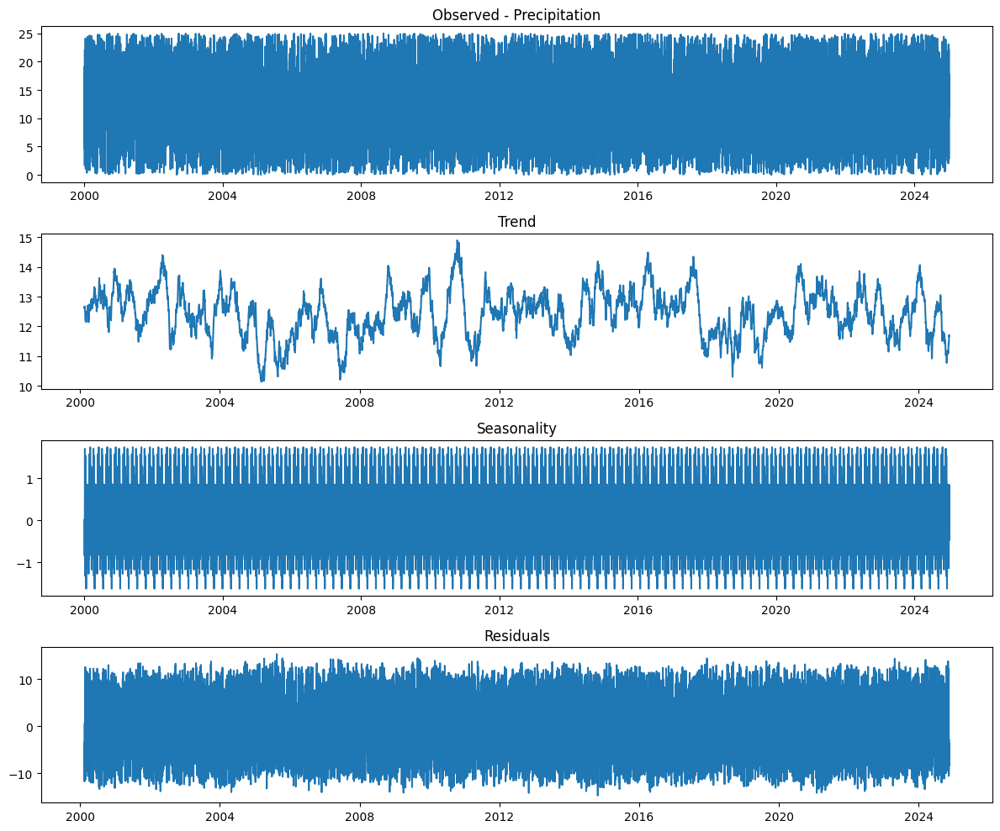

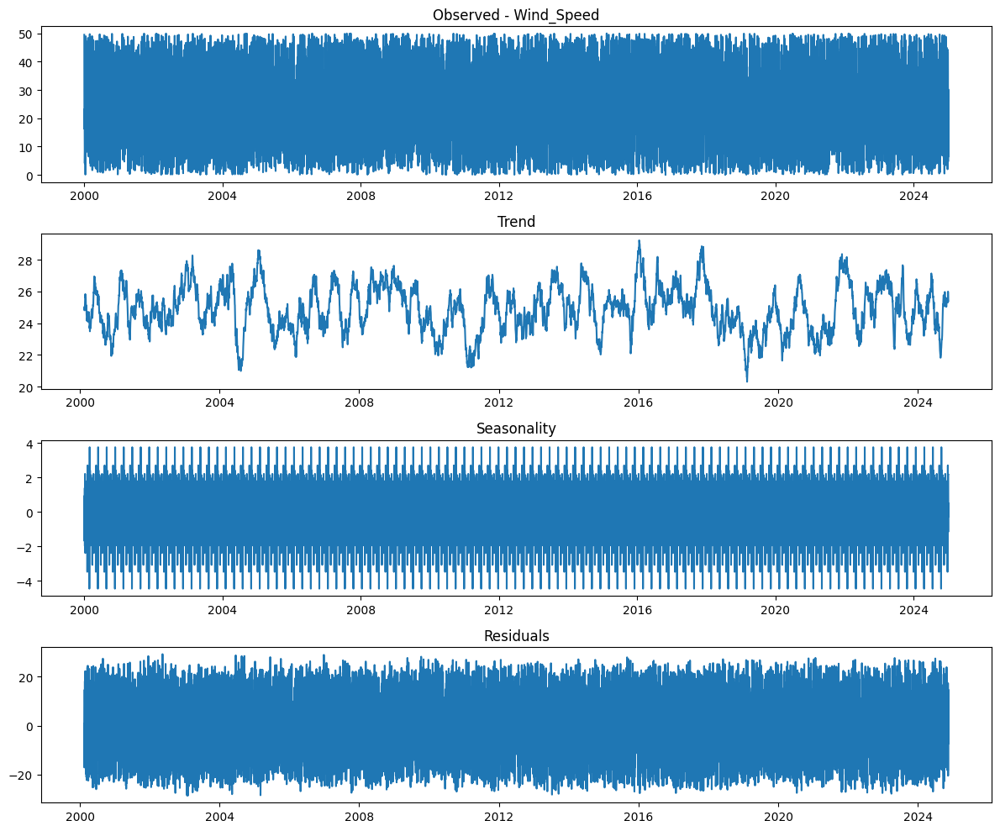

In [ ]:
# Decompose
def decompose(variable, period=30):
    decomposition = seasonal_decompose(df[variable], model='additive', period=period)

    plt.figure(figsize=(12, 10))
    plt.subplot(411)
    plt.plot(decomposition.observed)
    plt.title(f'Observed - {variable}')

    plt.subplot(412)
    plt.plot(decomposition.trend)
    plt.title('Trend')

    plt.subplot(413)
    plt.plot(decomposition.seasonal)
    plt.title('Seasonality')

    plt.subplot(414)
    plt.plot(decomposition.resid)
    plt.title('Residuals')

    plt.tight_layout()
    plt.show()

decompose('Fire_Risk_Index', period=90)
decompose('Temperature', period=90)
decompose('Humidity', period=90)
decompose('Precipitation',period = 90)
decompose('Wind_Speed',period = 90)

### *Decomposition Analysis by Vegetation Type*


Decomposition Analysis for: Shrubland


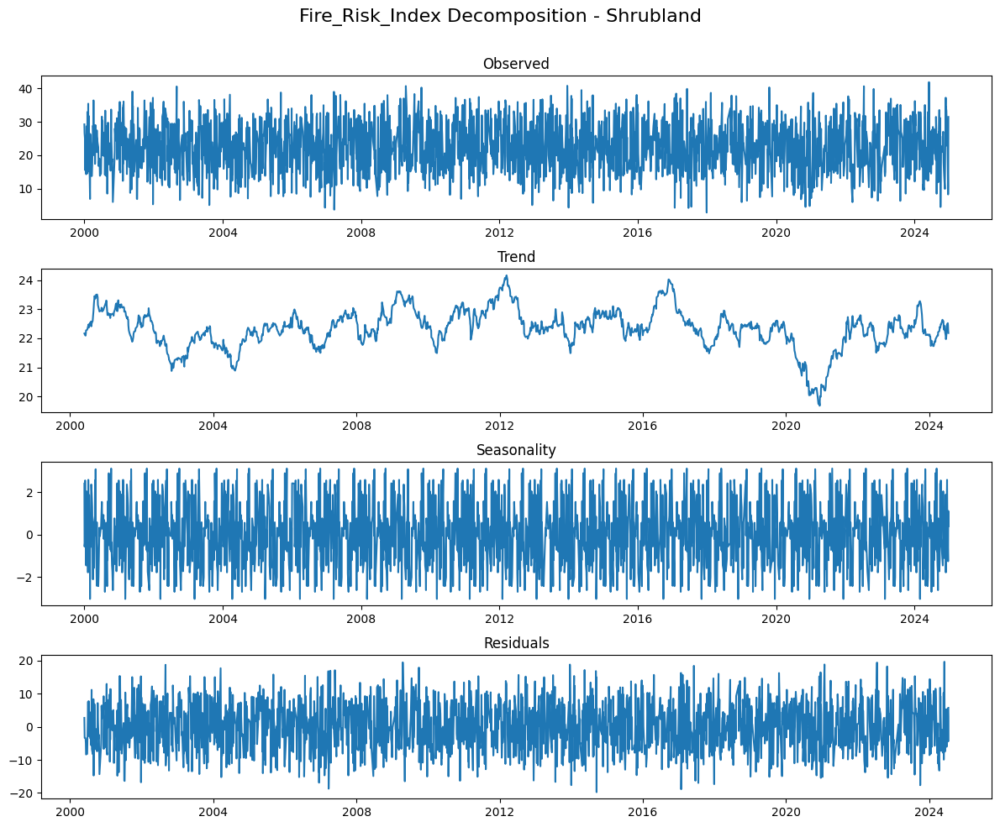

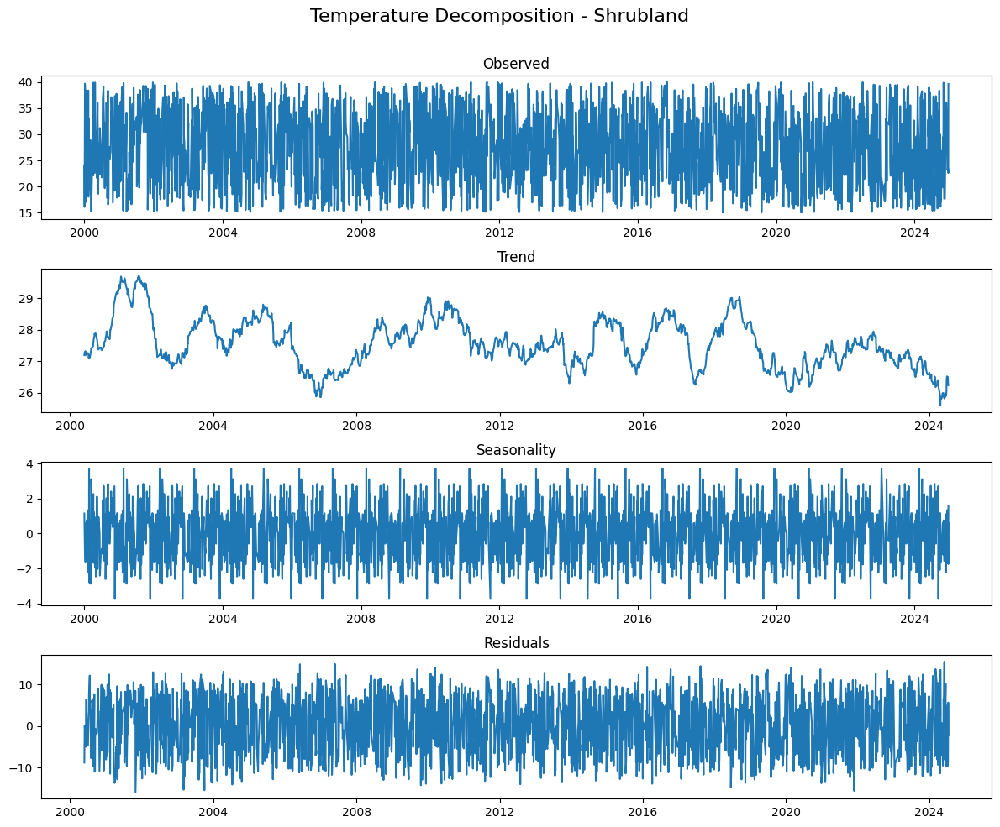

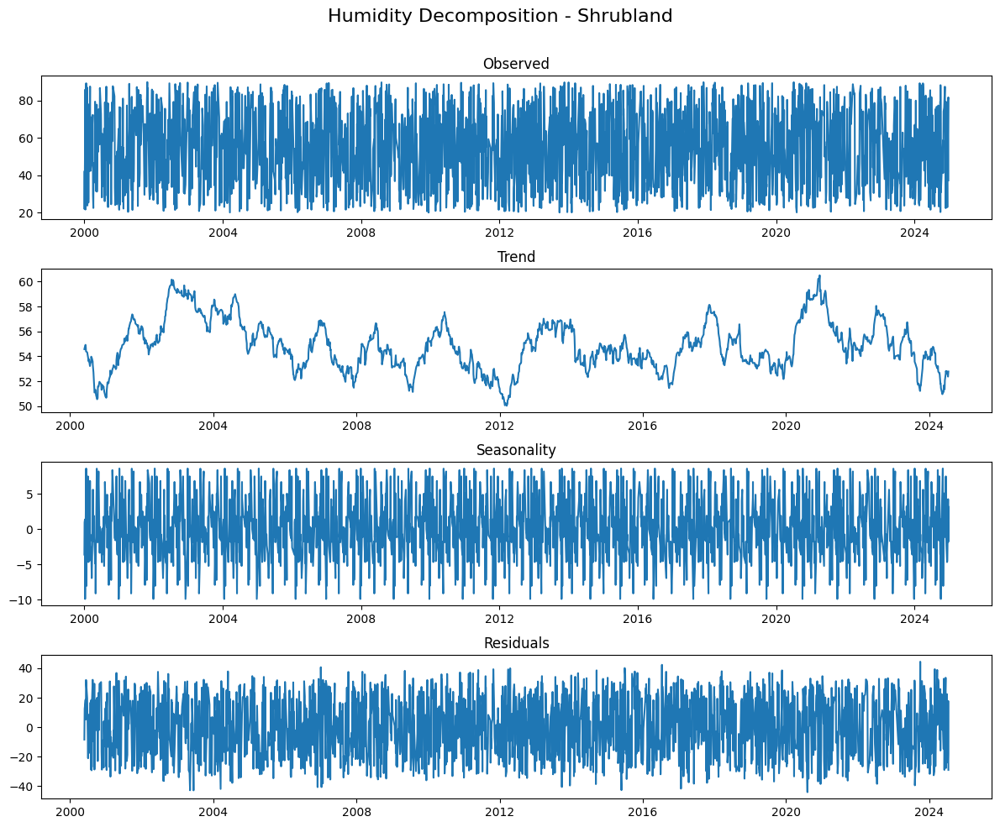

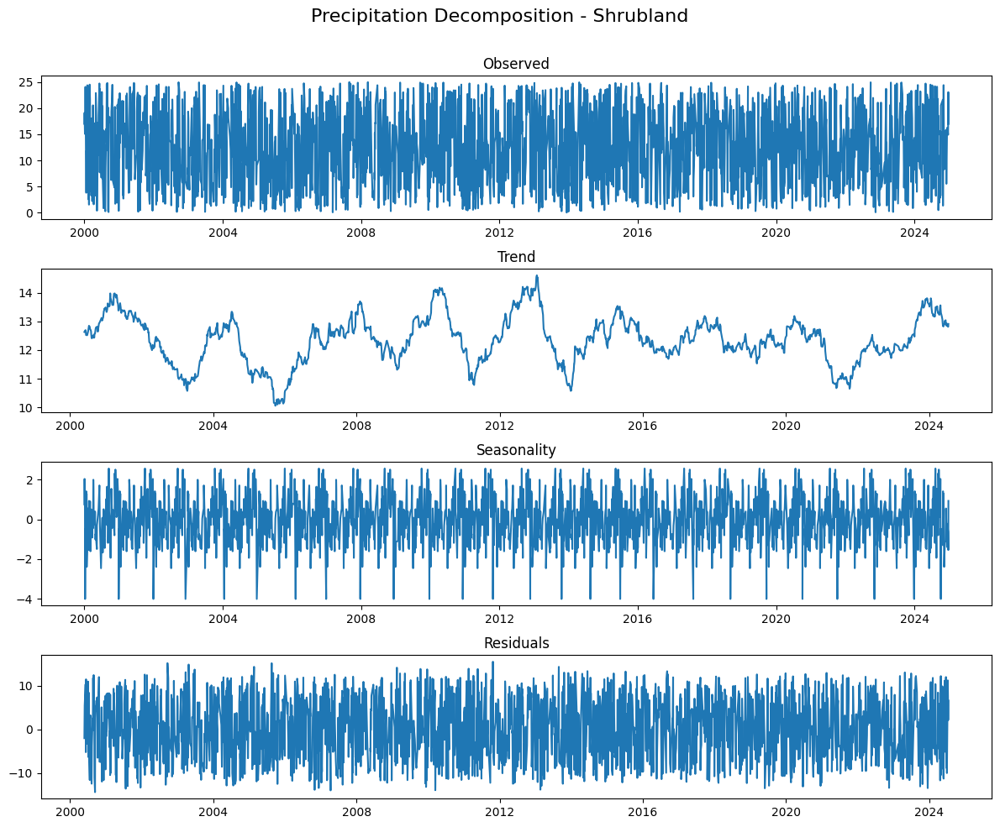

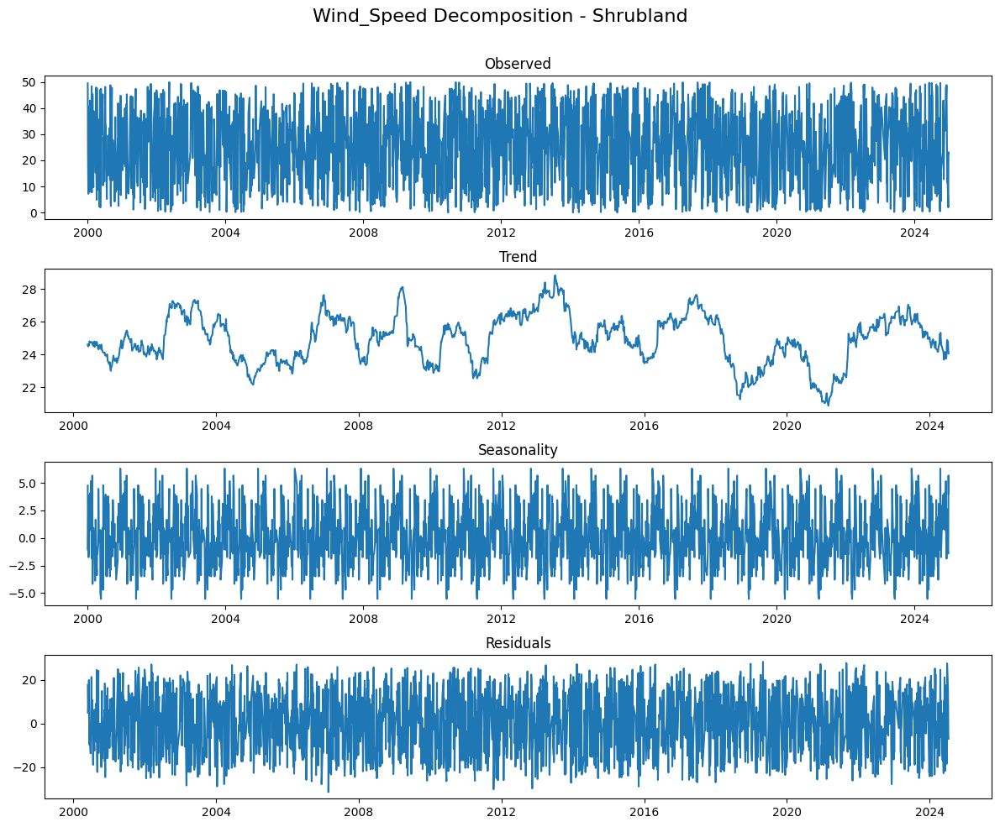


Decomposition Analysis for: Wetland


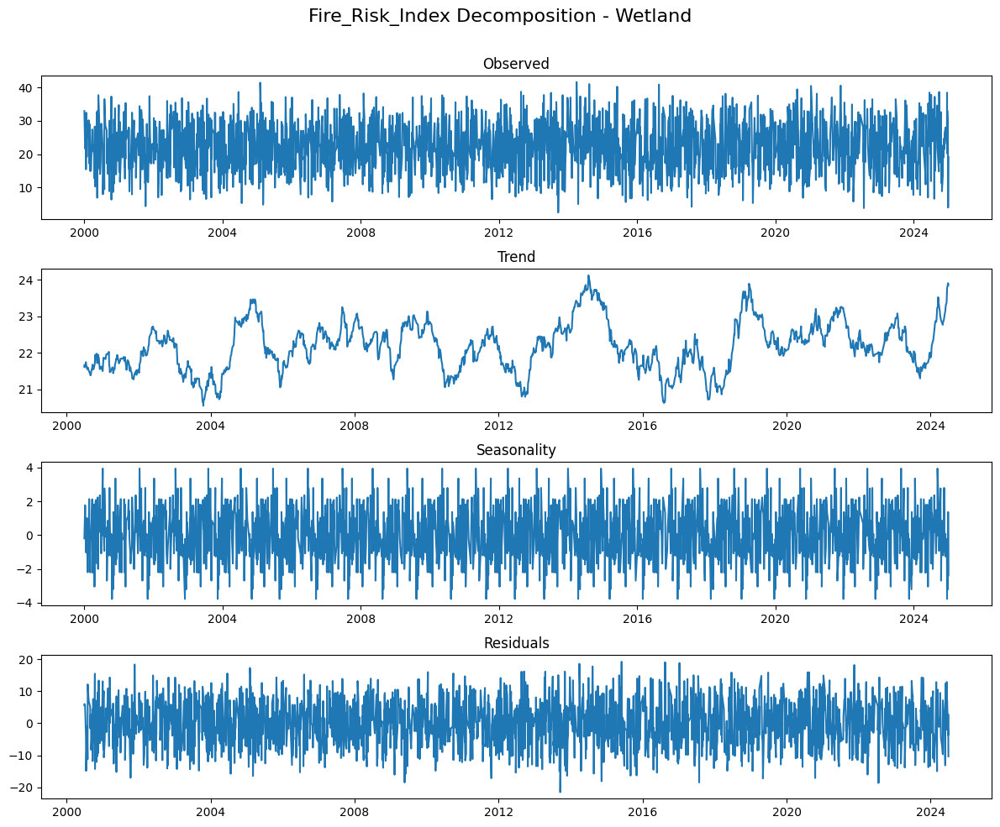

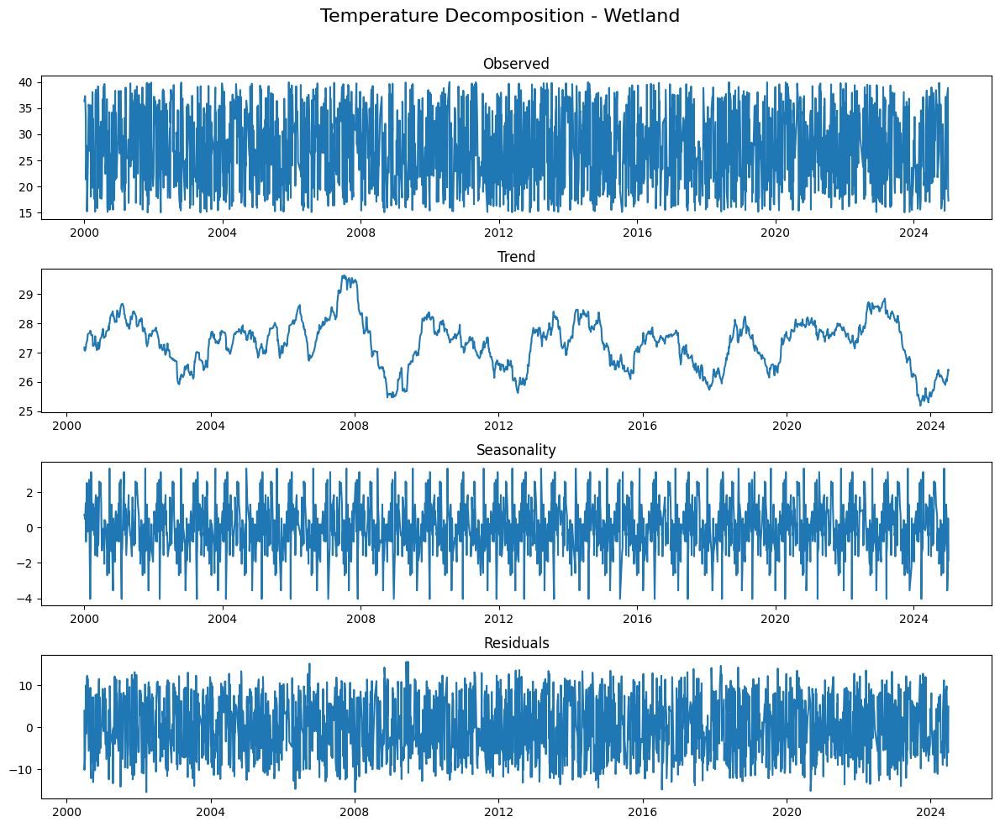

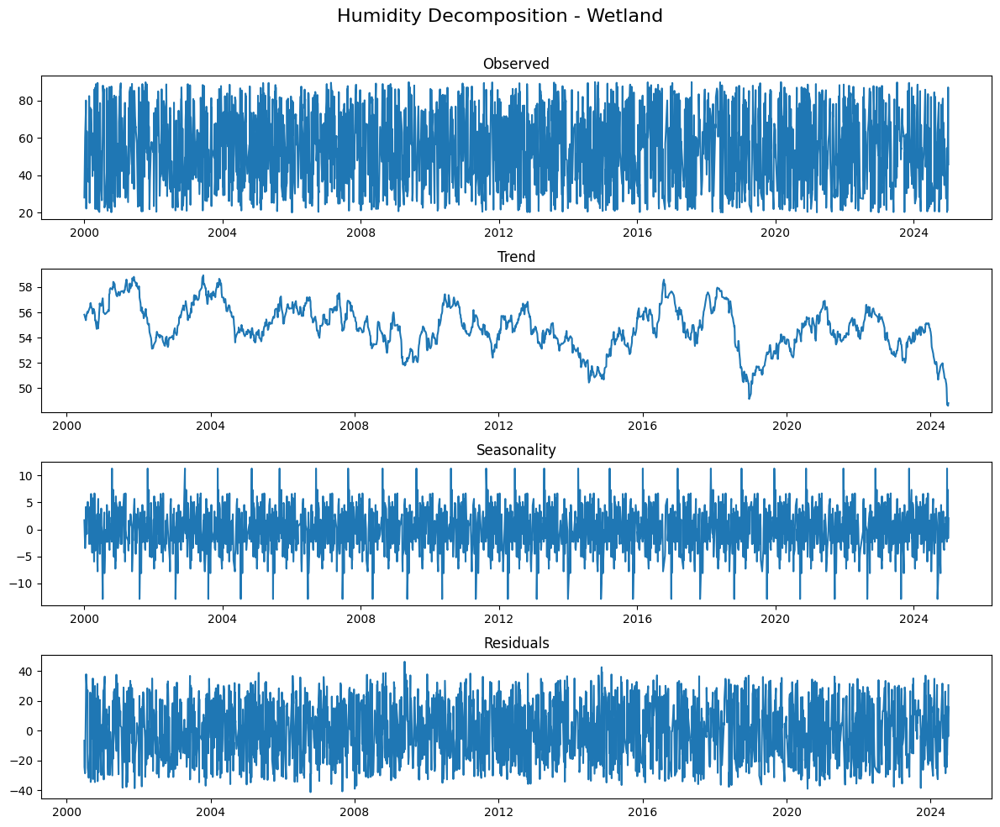

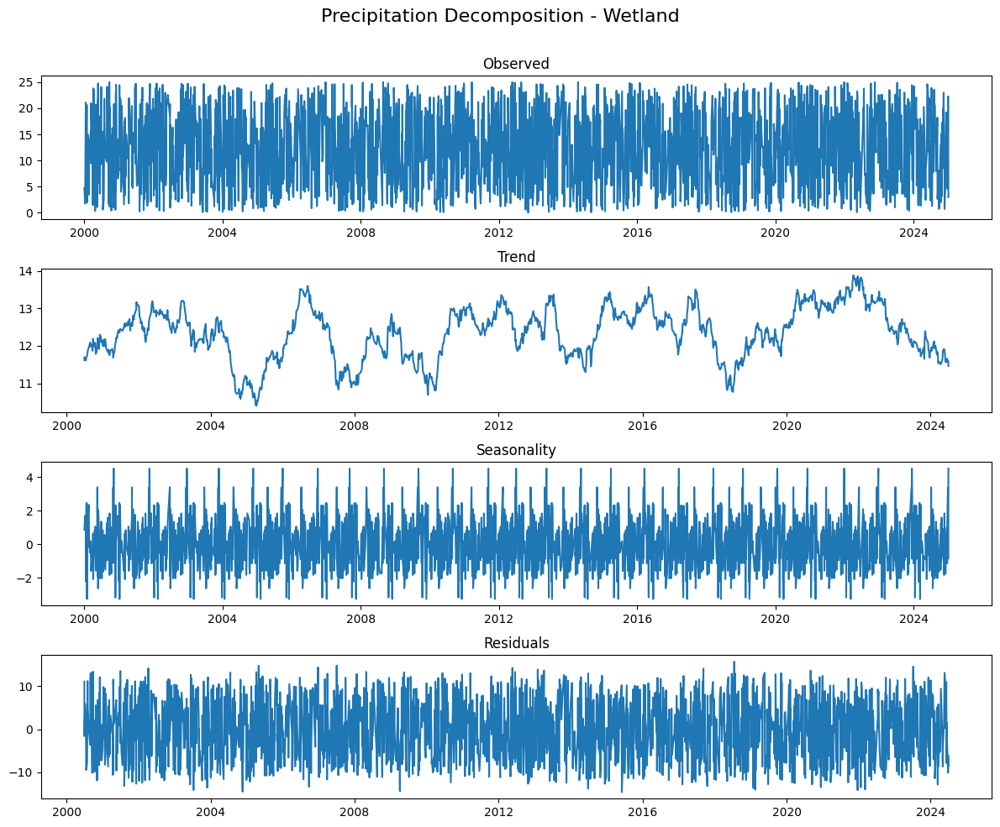

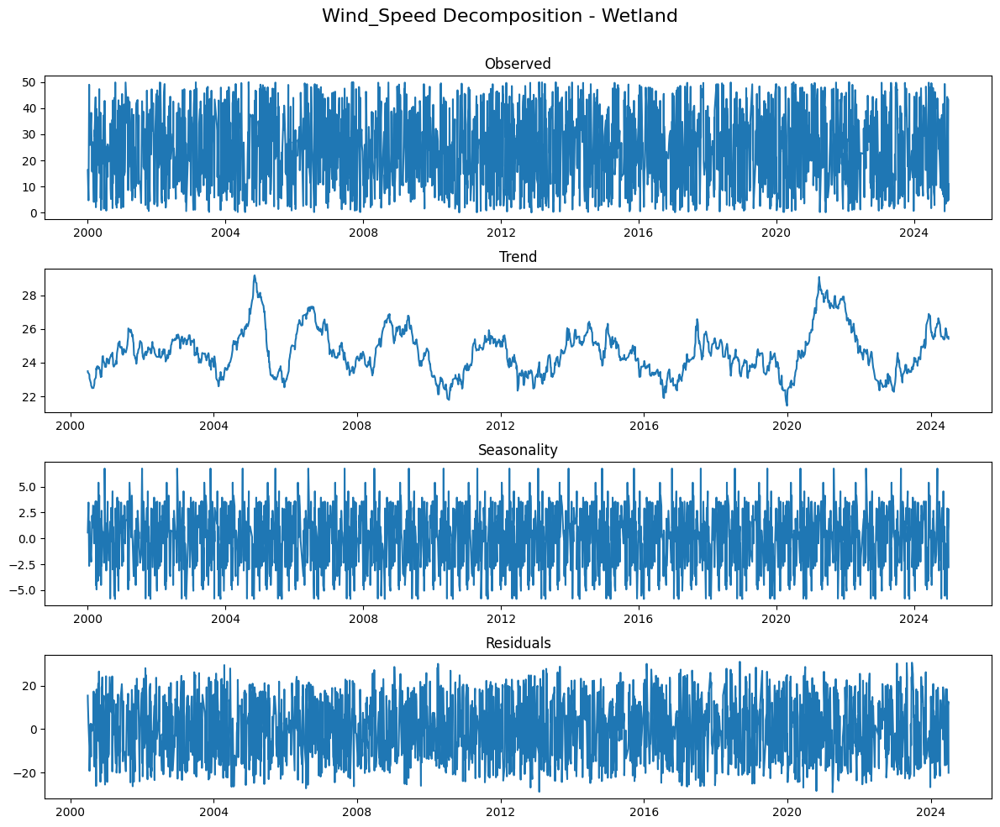


Decomposition Analysis for: Forest


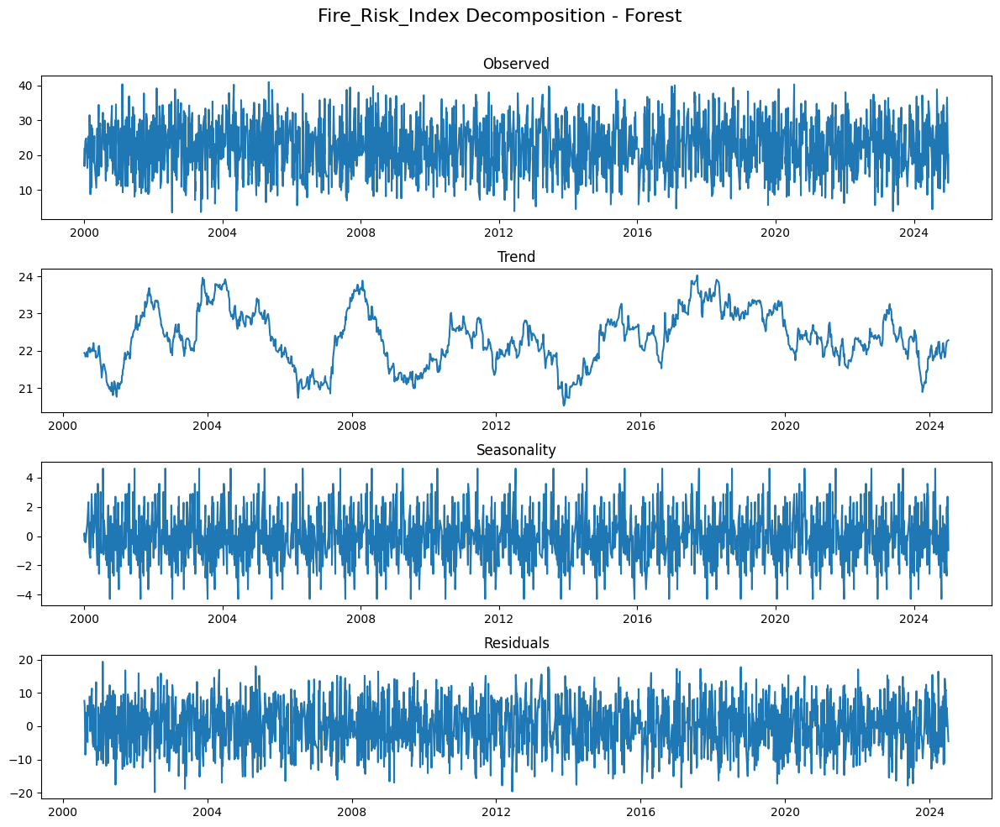

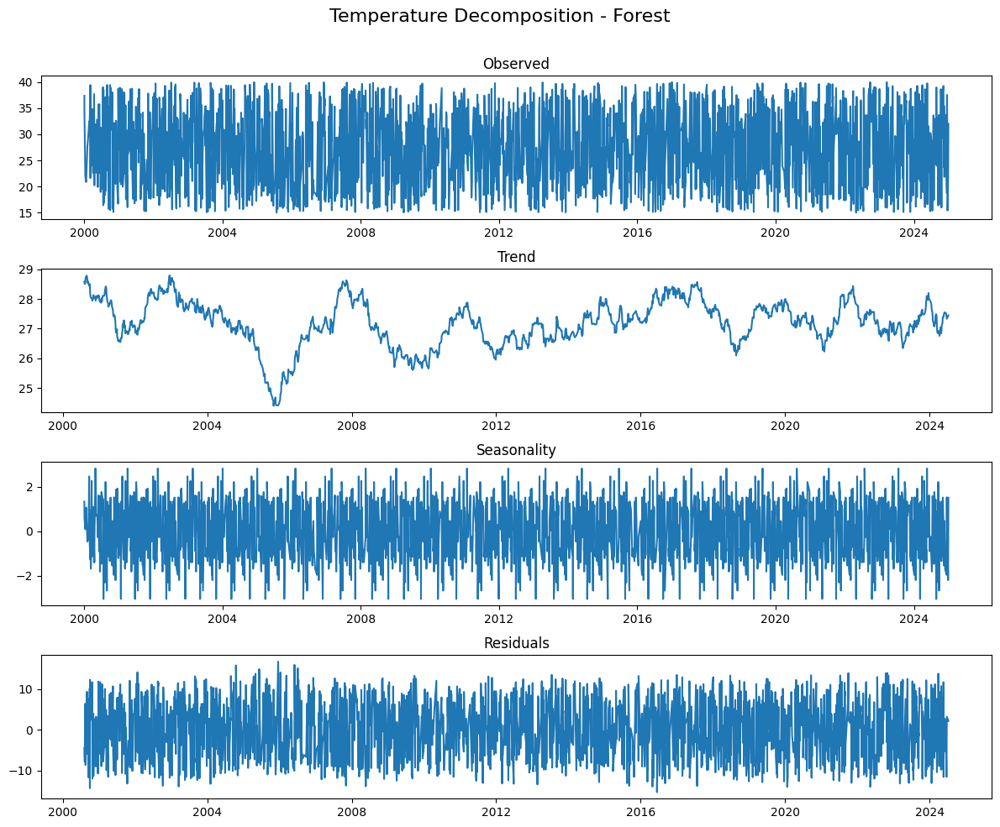

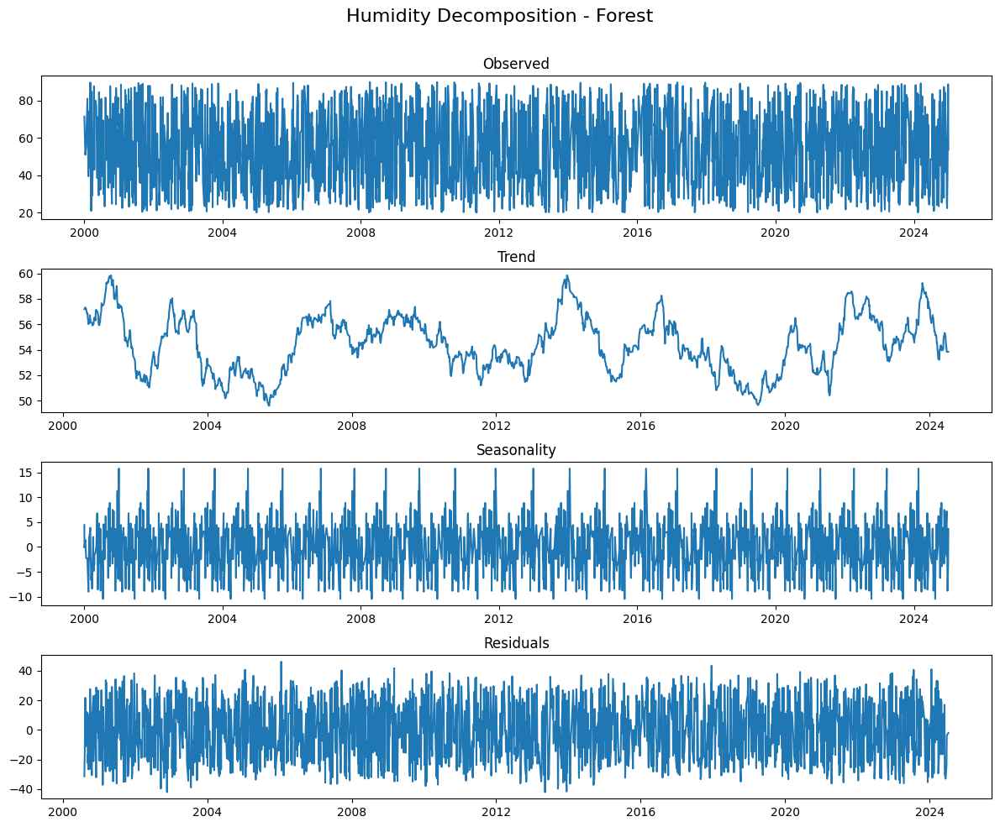

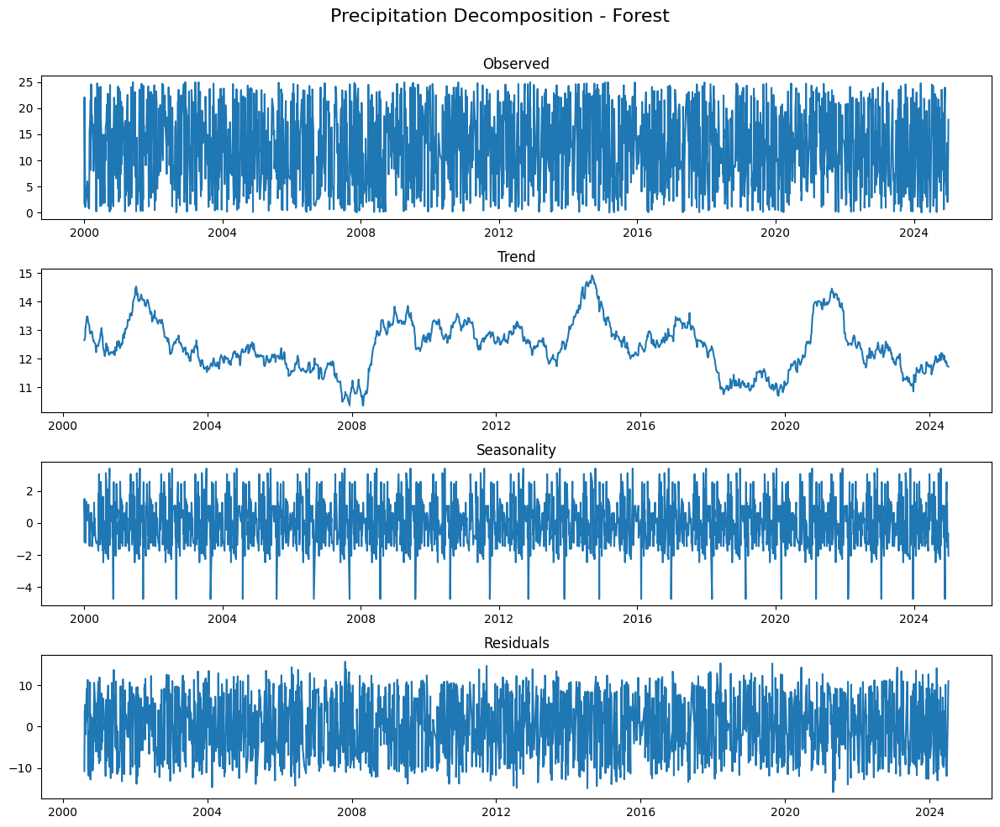

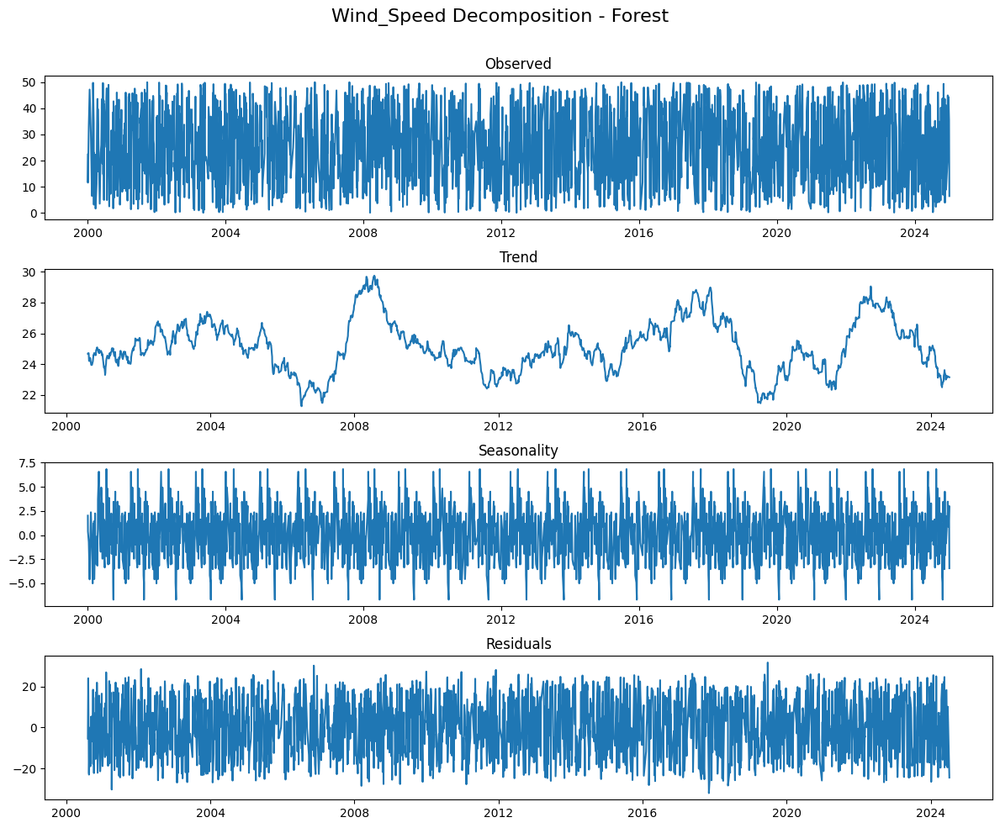


Decomposition Analysis for: Grassland


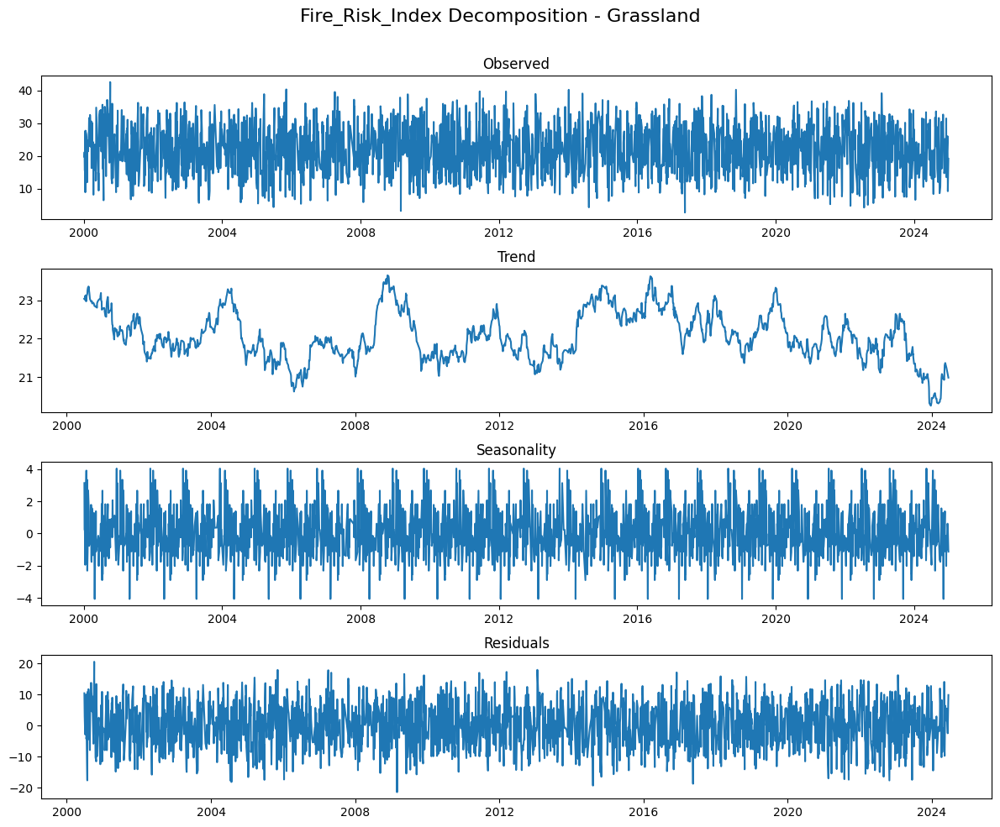

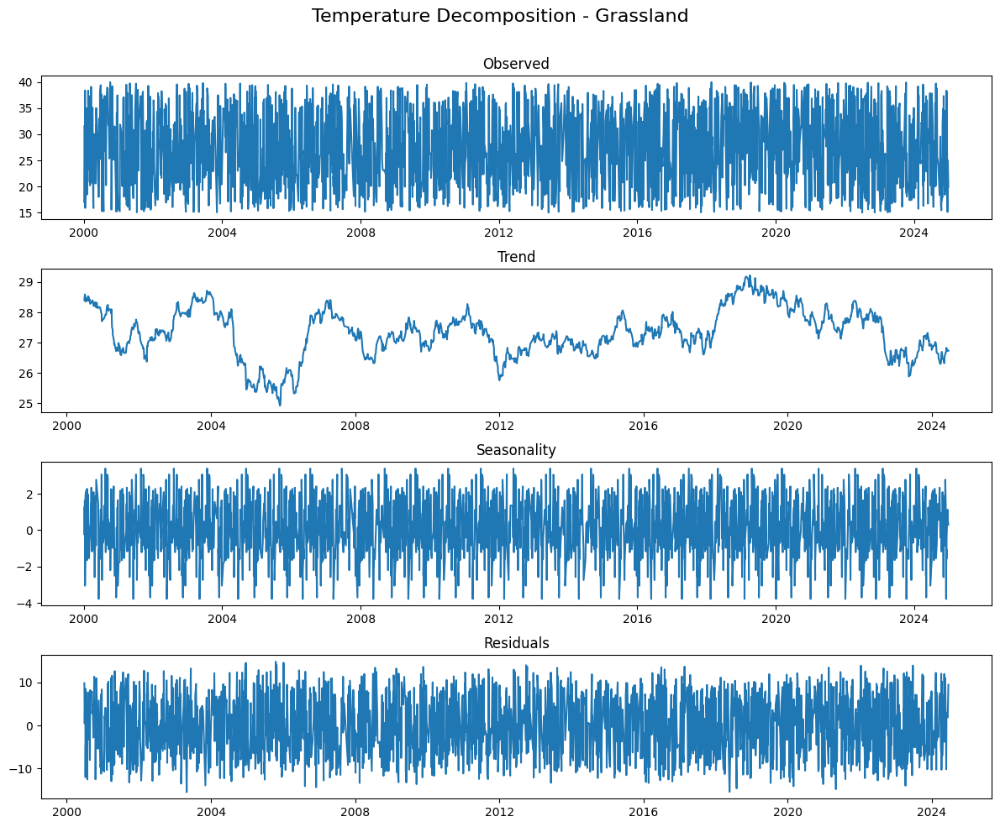

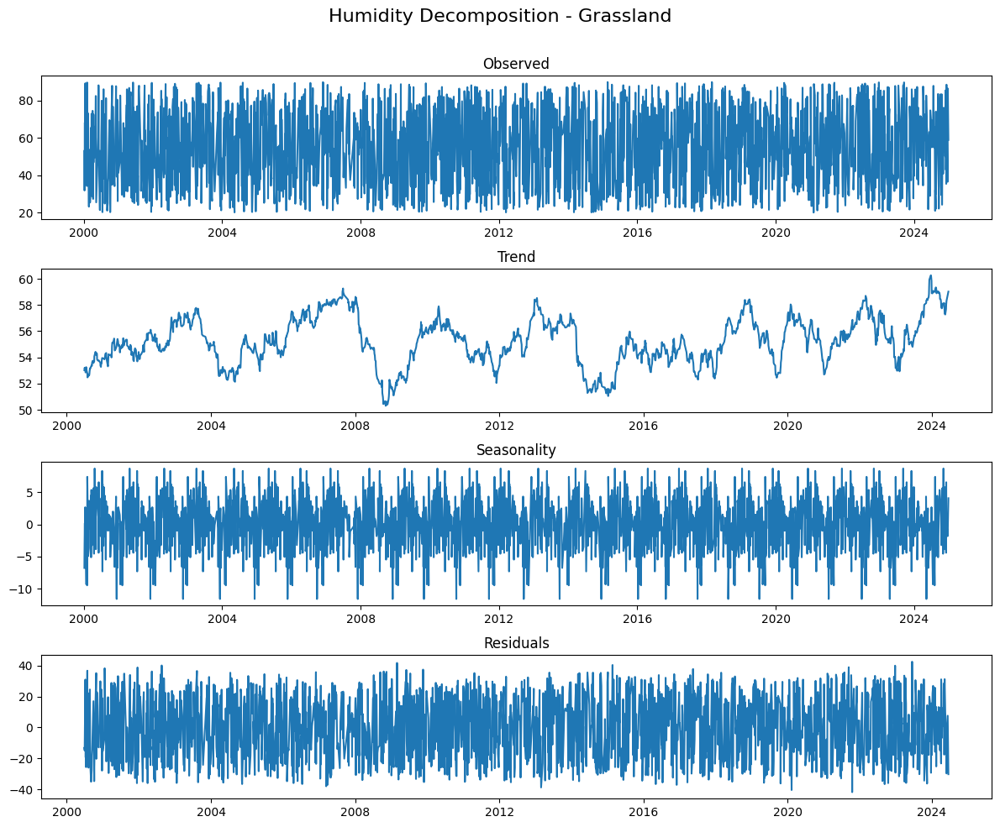

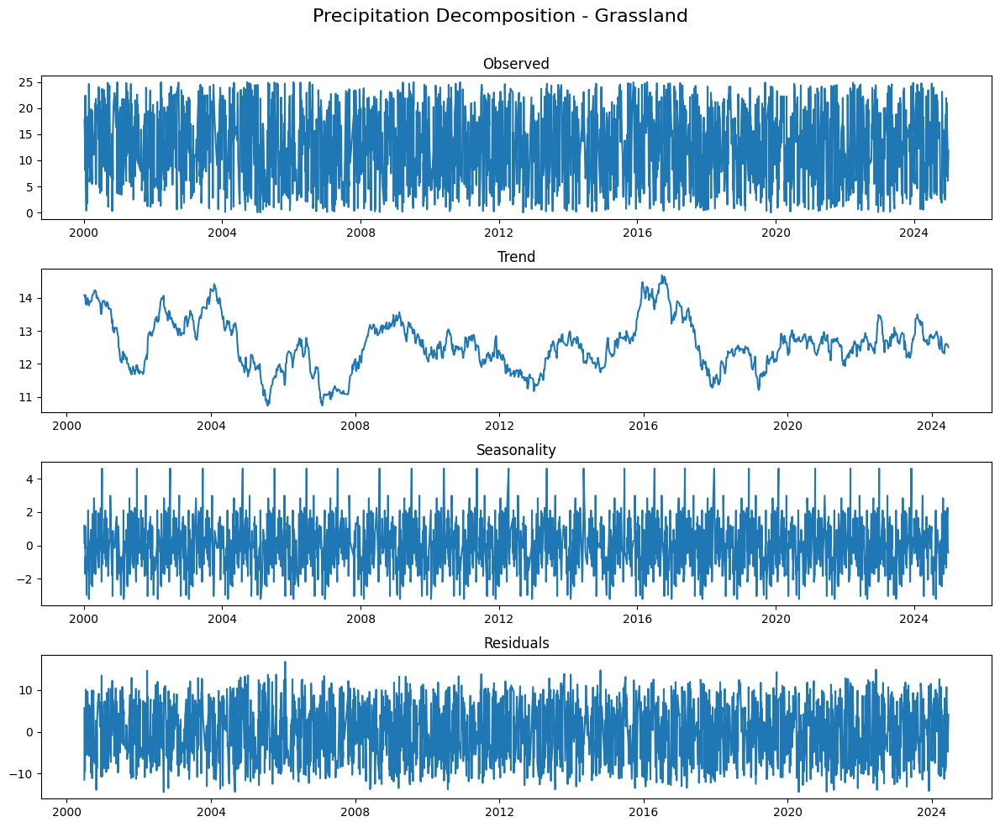

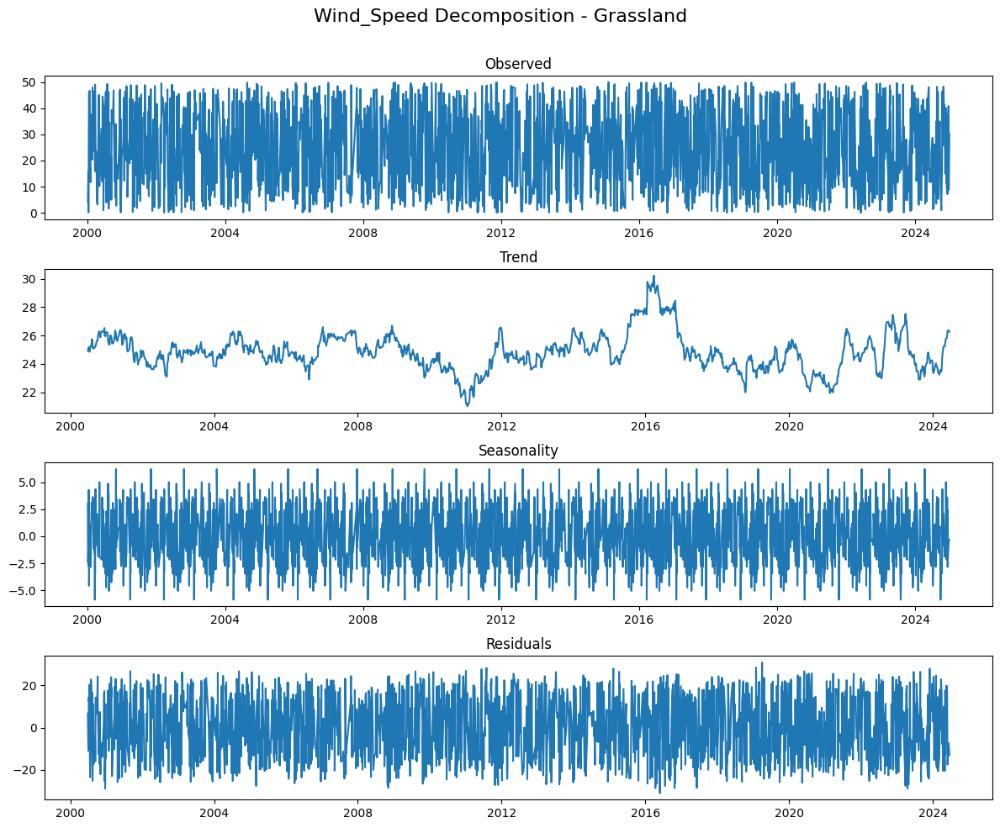

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import pandas as pd

# Get unique vegetation types
vegetation_types = df['Vegetation_Type'].unique()

def decompose_by_vegetation(df, variable, veg_type, period=30):
    # Filter data for specific vegetation type
    veg_data = df[df['Vegetation_Type'] == veg_type]

    # Make sure we have enough data for decomposition
    if len(veg_data) < period * 2:
        print(f"Not enough data for {veg_type} with period={period}. Adjusting period.")
        period = len(veg_data) // 4  # Use a quarter of available data as period
        if period < 2:
            print(f"Too little data for {veg_type} to perform decomposition. Skipping.")
            return

    # Perform decomposition
    decomposition = seasonal_decompose(veg_data[variable], model='additive', period=period)

    plt.figure(figsize=(12, 10))
    plt.suptitle(f'{variable} Decomposition - {veg_type}', fontsize=16)

    plt.subplot(411)
    plt.plot(decomposition.observed)
    plt.title('Observed')

    plt.subplot(412)
    plt.plot(decomposition.trend)
    plt.title('Trend')

    plt.subplot(413)
    plt.plot(decomposition.seasonal)
    plt.title('Seasonality')

    plt.subplot(414)
    plt.plot(decomposition.resid)
    plt.title('Residuals')

    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Make space for suptitle
    plt.show()

# Loop through each vegetation type
for veg_type in vegetation_types:
    print(f"\n{'='*50}")
    print(f"Decomposition Analysis for: {veg_type}")
    print(f"{'='*50}")

    # Decompose each variable for this vegetation type
    decompose_by_vegetation(df, 'Fire_Risk_Index', veg_type, period=90)
    decompose_by_vegetation(df, 'Temperature', veg_type, period=90)
    decompose_by_vegetation(df, 'Humidity', veg_type, period=90)
    decompose_by_vegetation(df, 'Precipitation', veg_type, period=90)
    decompose_by_vegetation(df, 'Wind_Speed', veg_type, period=90)

### *Autocorrelation and Partial Autocorrelation Analysis*
The plan for further steps involved specifically forecasting the Fire Risk Index variable, and using it, along with the other variables, to classify and predict the binary Fire Occurrence variable. In order to understand the lag effects for the climatic and Fire Risk variables, we applied the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots for each time series variable. These plots help us determine whether past values have a significant influence on the current values, which is particularly useful when developing time series forecasting models. These plots are also useful for determining p and q values for AR and MA orders respectively.

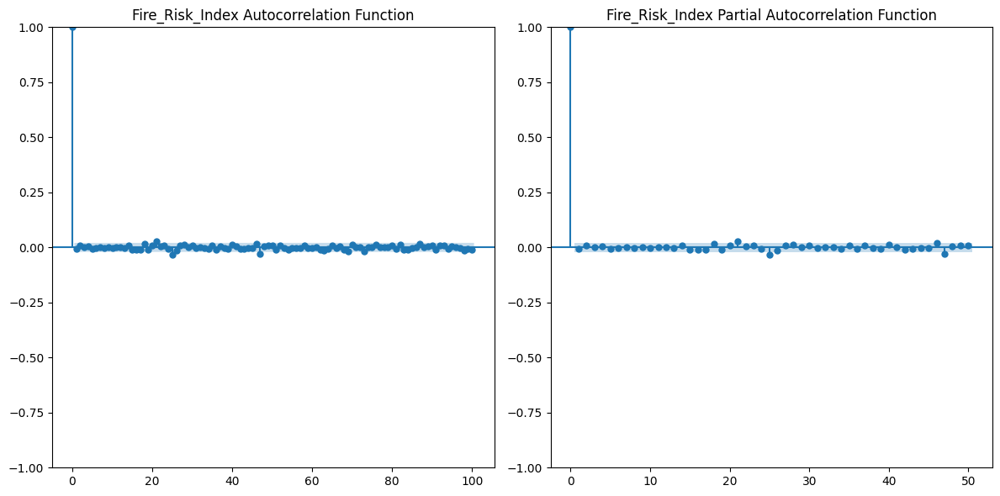

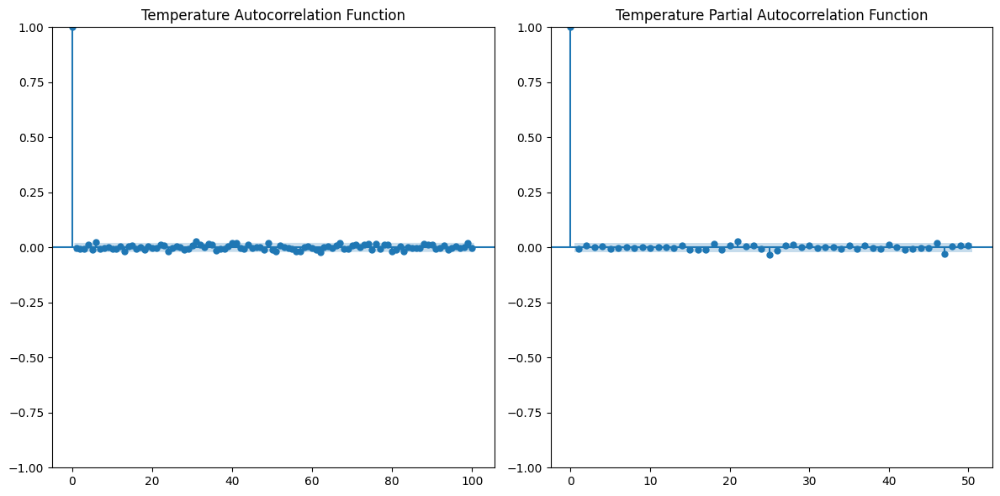

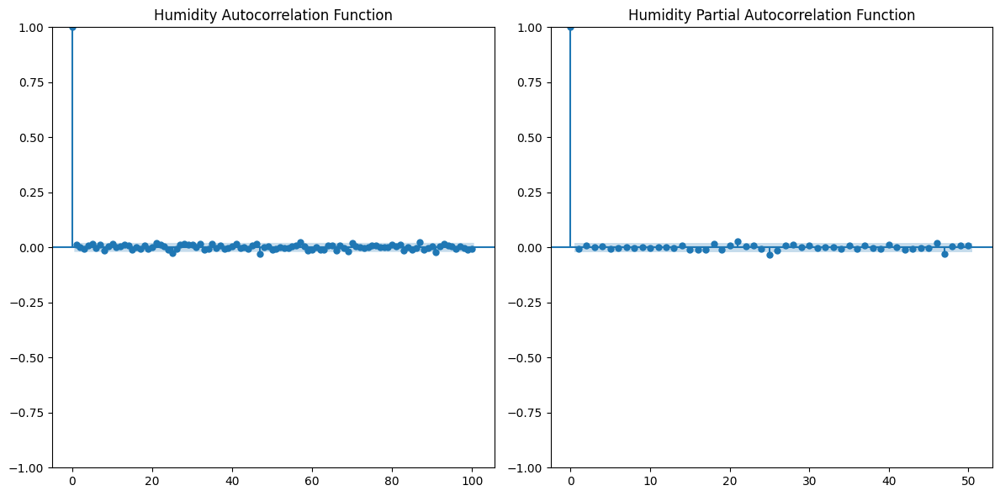

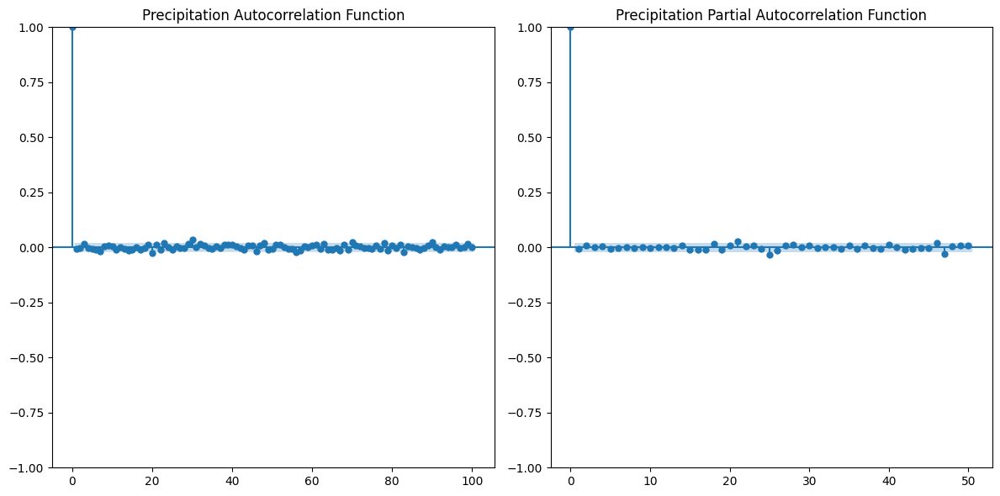

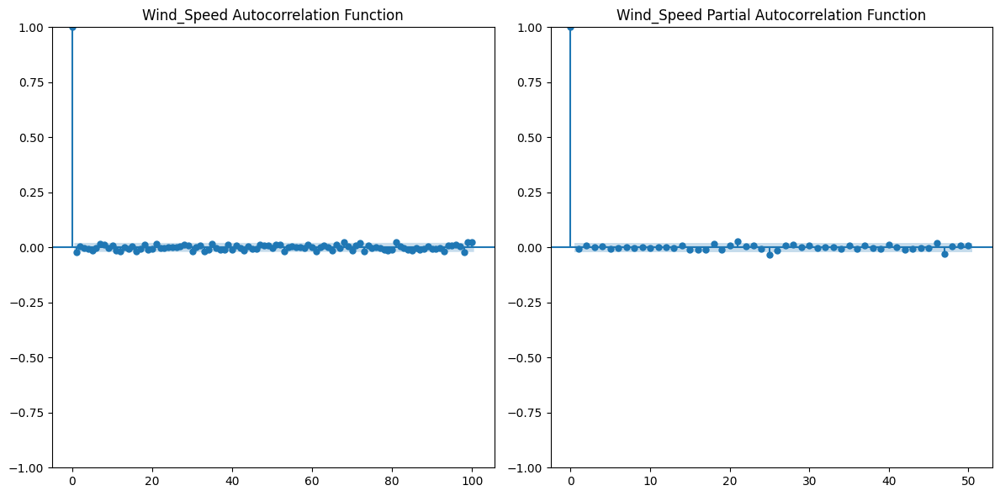

In [ ]:
def acf_pacf(variable):

    plt.figure(figsize=(12, 6))

    plt.subplot(121)
    plot_acf(df[variable].dropna(), lags=100, ax=plt.gca())
    plt.title(f"{variable} Autocorrelation Function")

    plt.subplot(122)
    plot_pacf(df['Fire_Risk_Index'].dropna(), lags=50, ax=plt.gca())
    plt.title(f"{variable} Partial Autocorrelation Function")

    plt.tight_layout()
    plt.show()

acf_pacf('Fire_Risk_Index')
acf_pacf('Temperature')
acf_pacf('Humidity')
acf_pacf('Precipitation')
acf_pacf('Wind_Speed')

Since both the ACF and the PACF plots fall sharply to near zero after lag 0, it suggests that the time series might be very simple, where no significant autocorrelation or partial autocorrelation exists and no autoregressive or moving average components are required. However we still performed grid search and selected the best p and q values using AIC/BIC  since they balance fit and complexity.

### *ACF and PACF by vegetation type*


ACF/PACF Analysis for: Shrubland


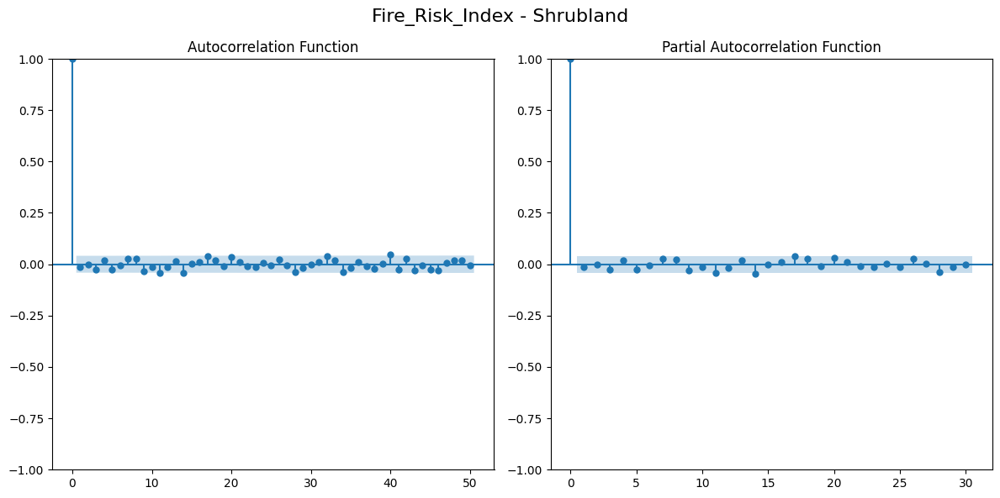

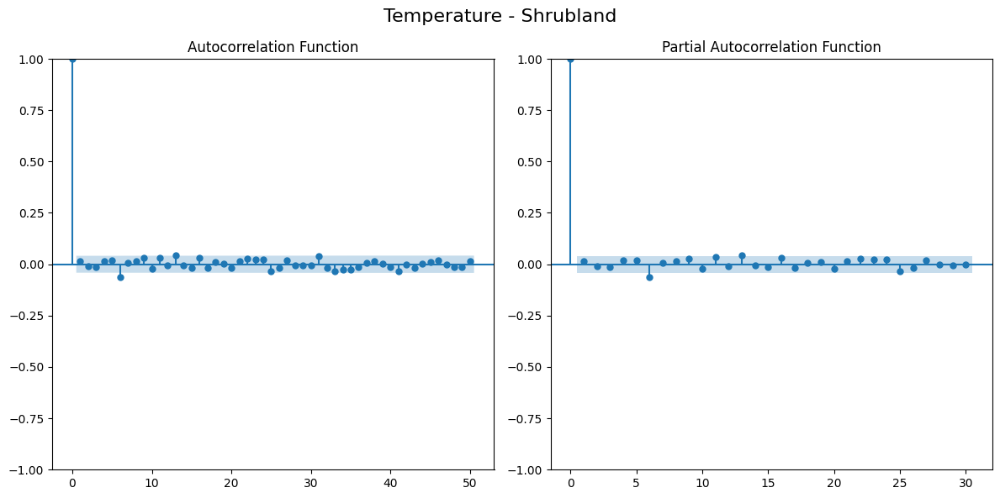

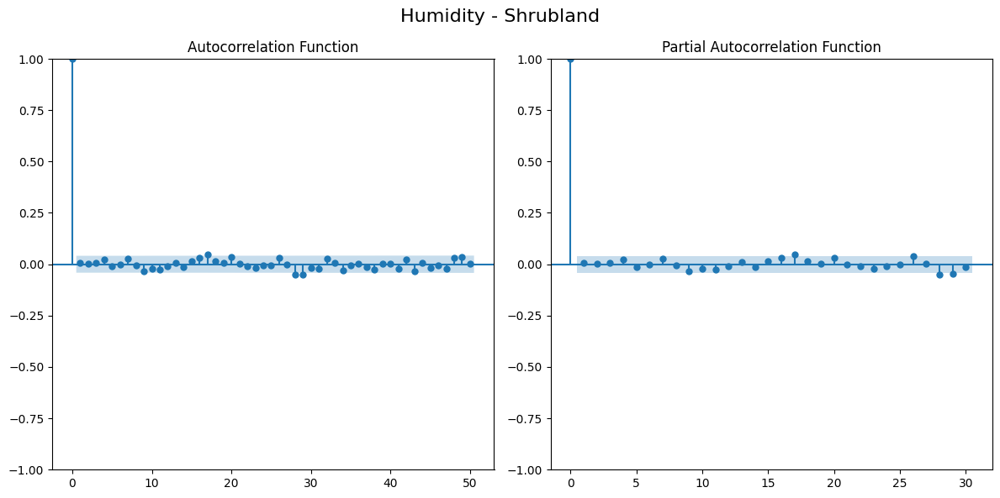

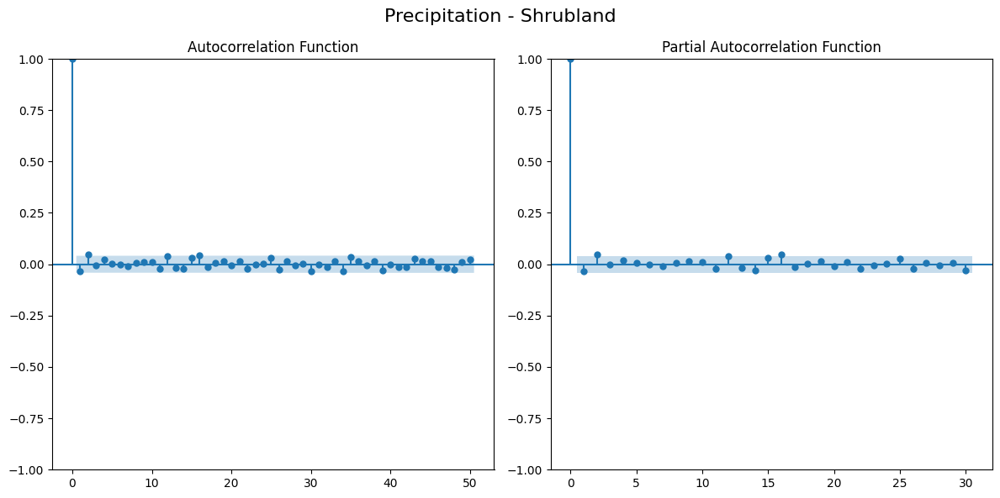

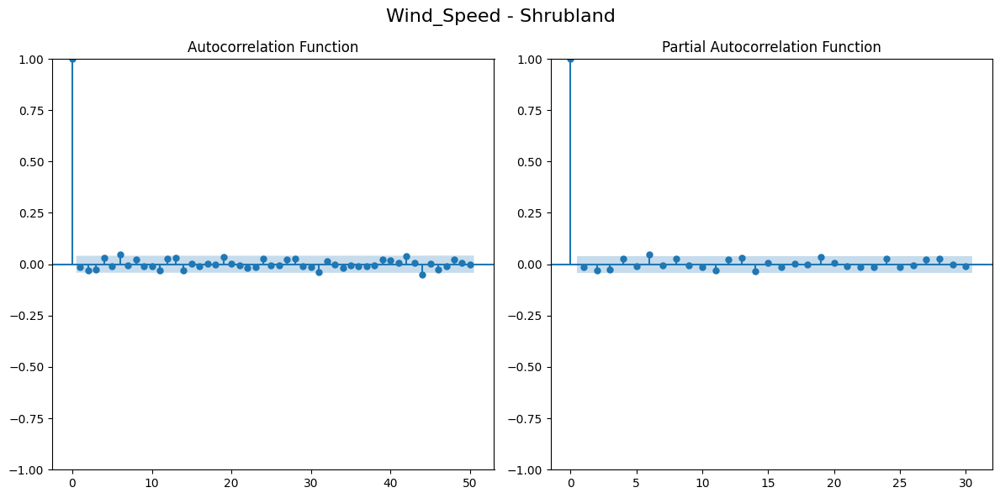


ACF/PACF Analysis for: Wetland


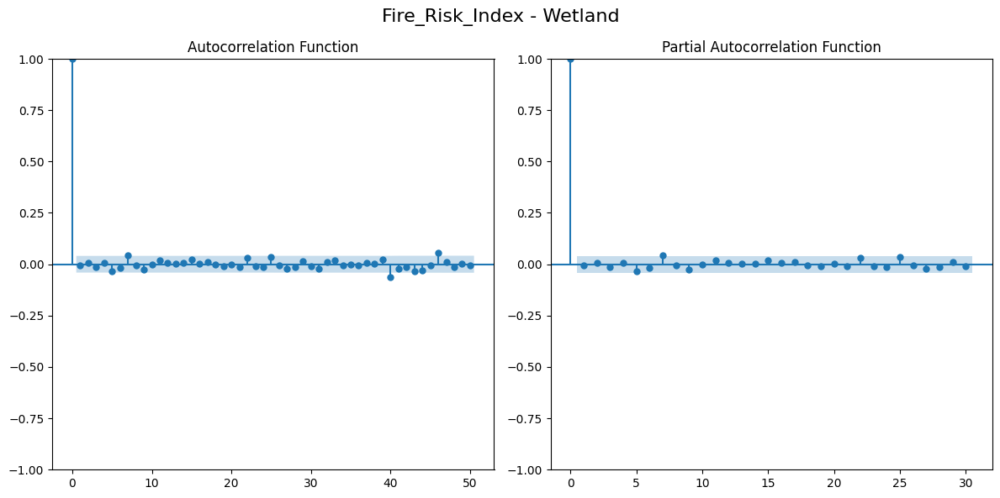

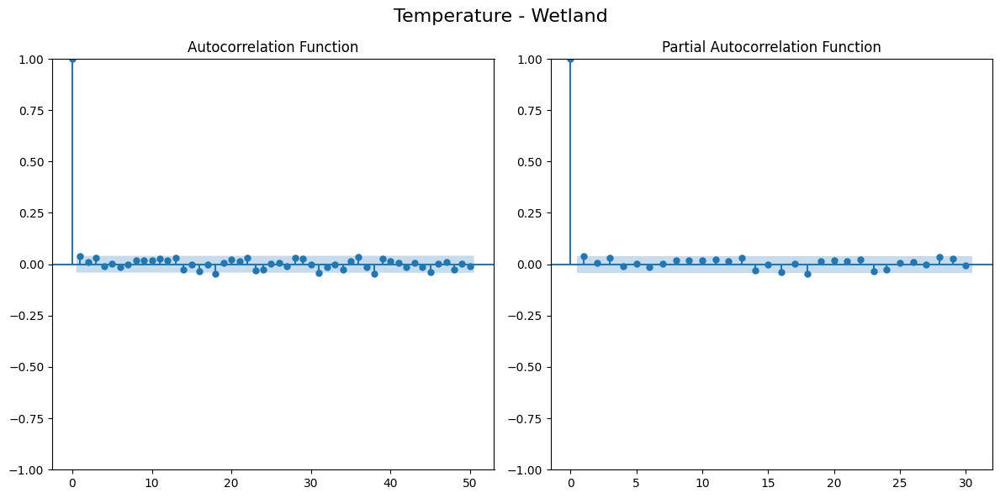

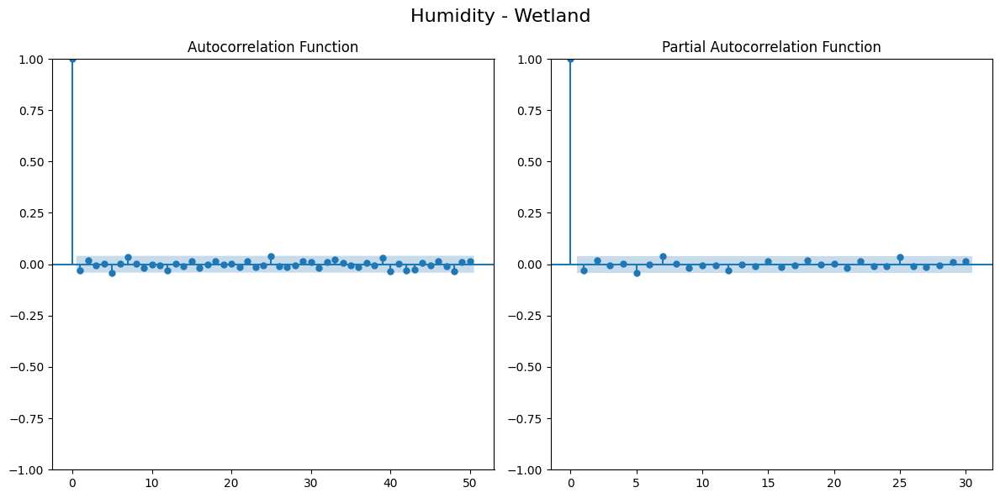

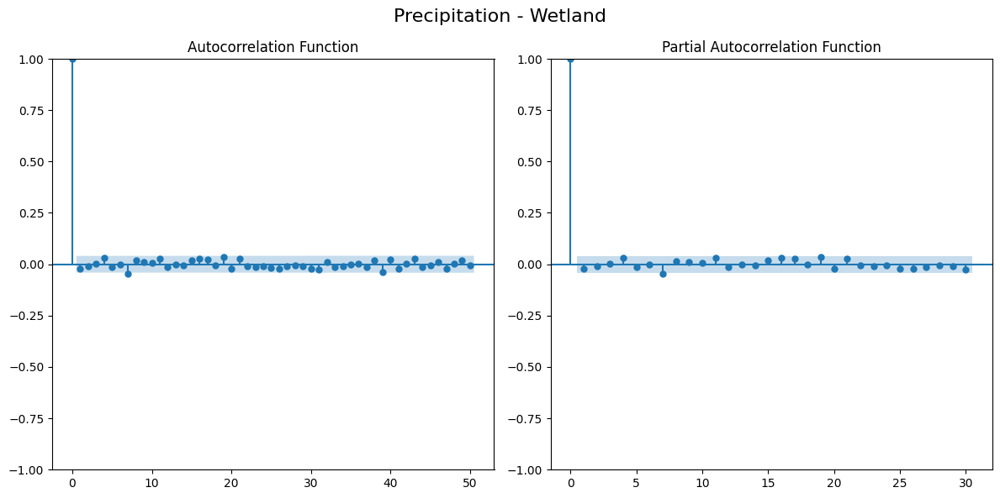

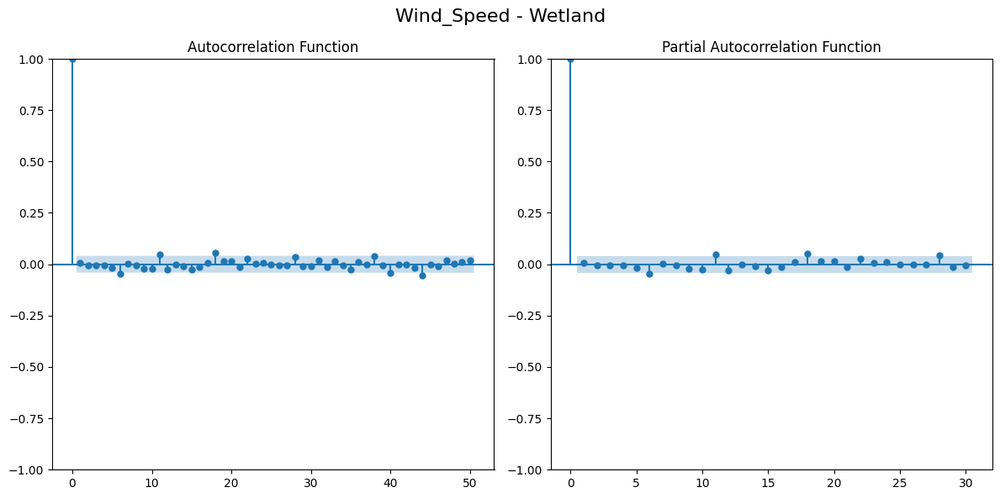


ACF/PACF Analysis for: Forest


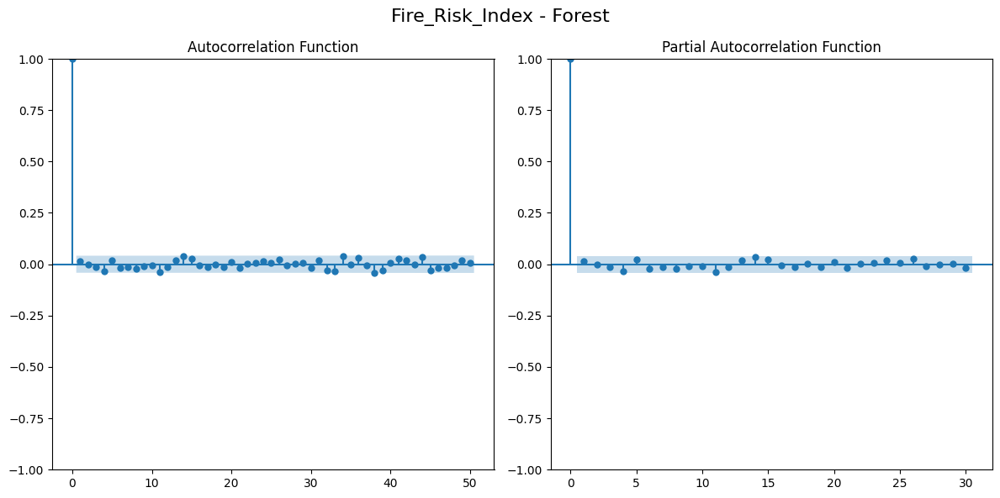

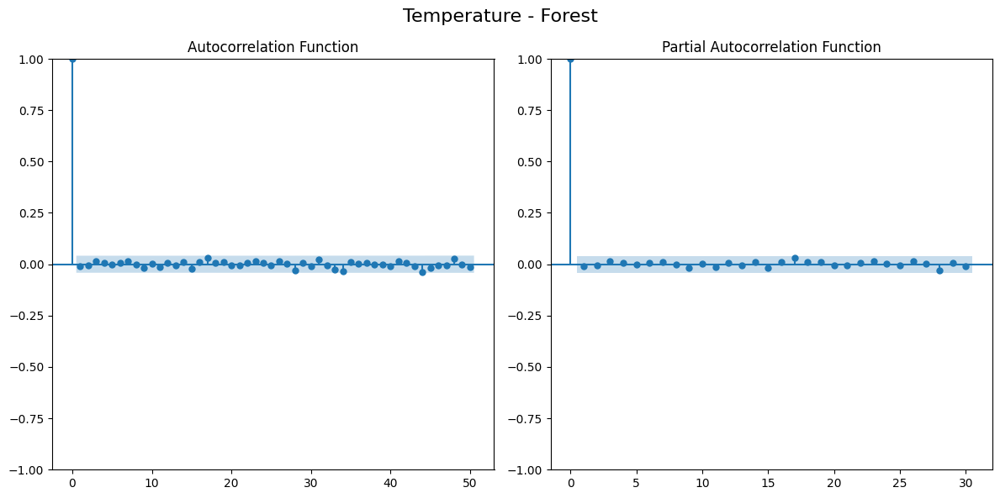

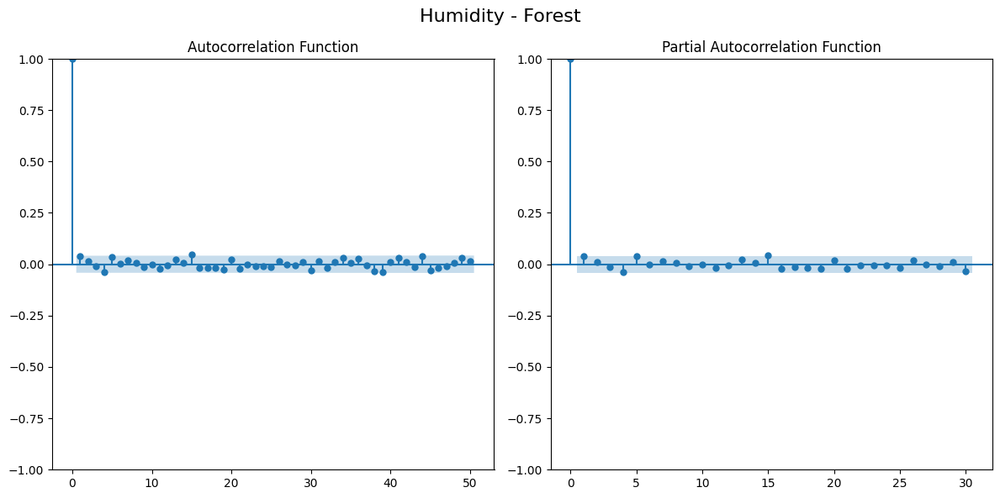

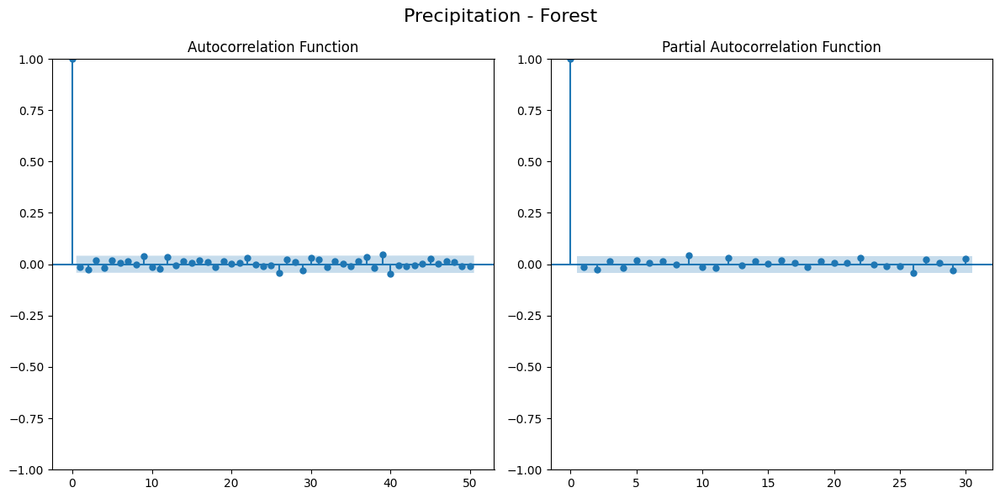

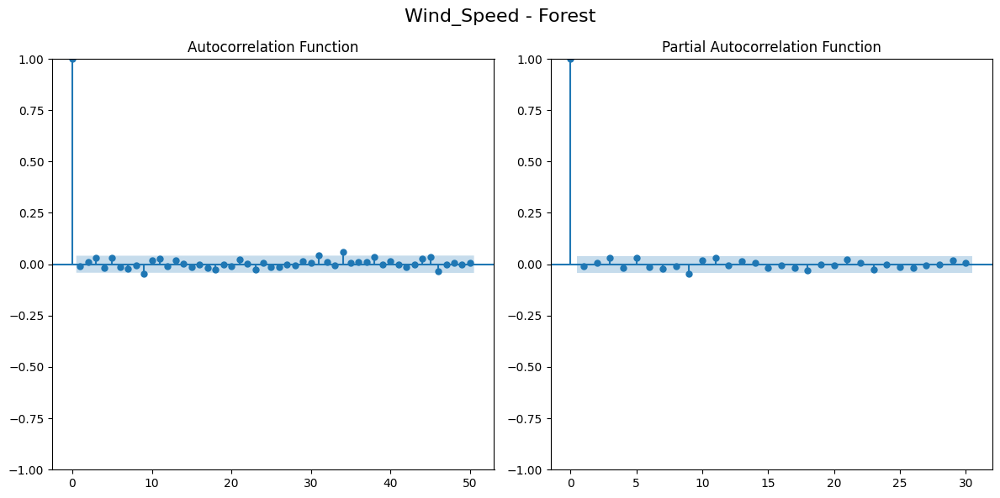


ACF/PACF Analysis for: Grassland


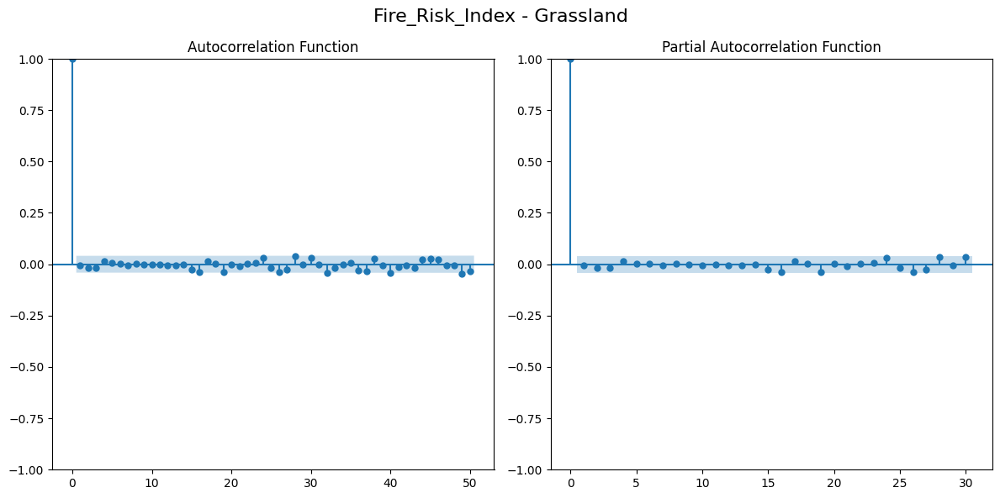

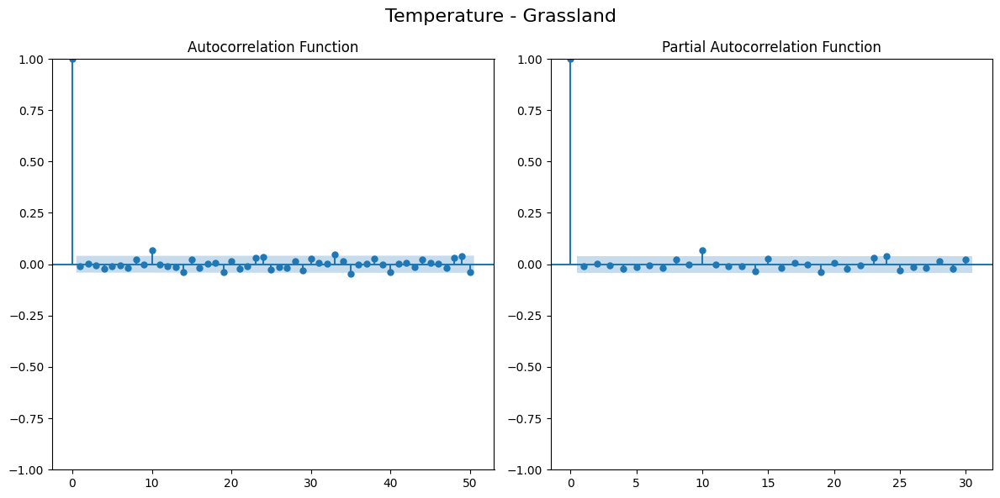

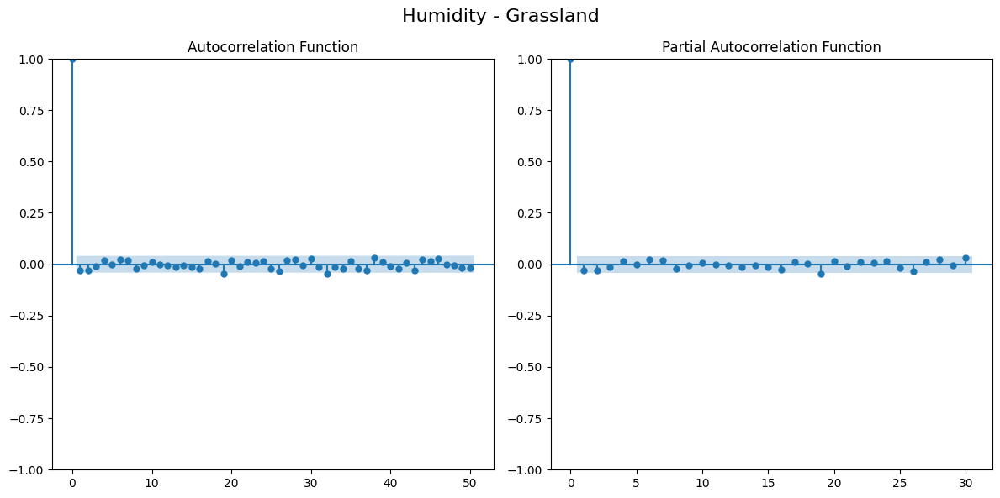

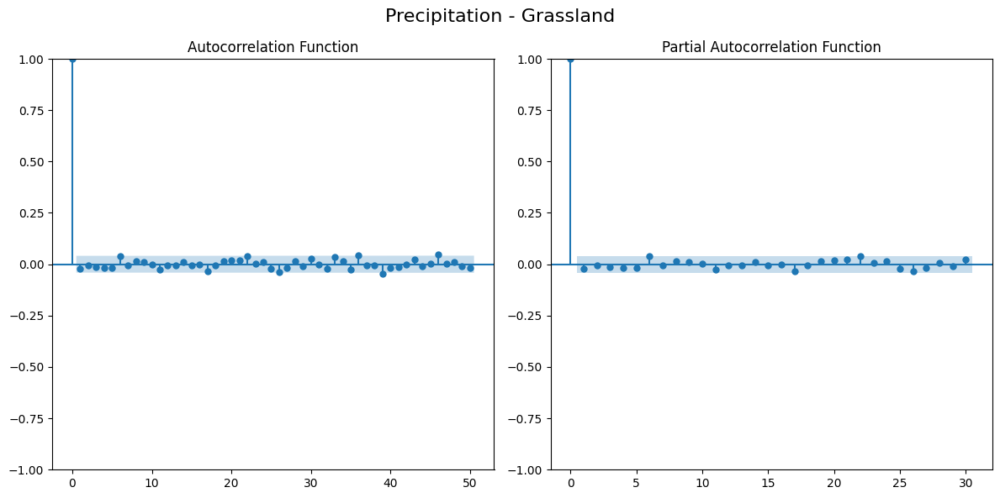

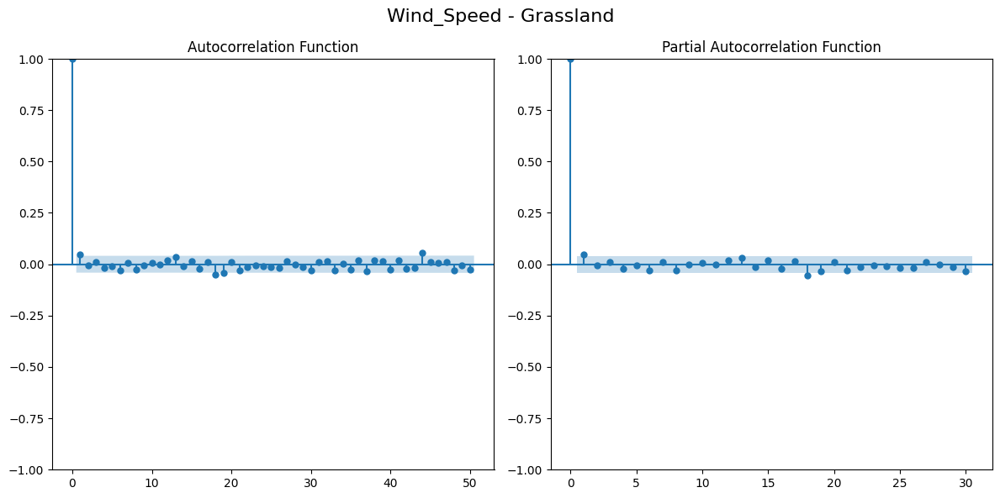

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
import pandas as pd

def acf_pacf_by_vegetation(df, variable, veg_type):

    veg_data = df[df['Vegetation_Type'] == veg_type]

    plt.figure(figsize=(12, 6))
    plt.suptitle(f"{variable} - {veg_type}", fontsize=16)

    plt.subplot(121)
    plot_acf(veg_data[variable].dropna(), lags=50, ax=plt.gca())
    plt.title(f"Autocorrelation Function")

    plt.subplot(122)
    plot_pacf(veg_data[variable].dropna(), lags=30, ax=plt.gca())
    plt.title(f"Partial Autocorrelation Function")

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Make space for suptitle
    plt.show()


vegetation_types = df['Vegetation_Type'].unique()

for veg_type in vegetation_types:
    print(f"\n{'='*50}")
    print(f"ACF/PACF Analysis for: {veg_type}")
    print(f"{'='*50}")

    # Analyze each variable for this vegetation type
    acf_pacf_by_vegetation(df, 'Fire_Risk_Index', veg_type)
    acf_pacf_by_vegetation(df, 'Temperature', veg_type)
    acf_pacf_by_vegetation(df, 'Humidity', veg_type)
    acf_pacf_by_vegetation(df, 'Precipitation', veg_type)
    acf_pacf_by_vegetation(df, 'Wind_Speed', veg_type)

## Predicting Fire Risk Index

In [ ]:
train_size = int(len(df) * 0.8)
train = df.iloc[:train_size]
test = df.iloc[train_size:]

print(f"Training set: {train.shape}")
print(f"Test set: {test.shape}")

Training set: (7305, 7)
Test set: (1827, 7)


Since the data is already stationary, no differencing will be required. However, given the existence of variables apart from the Fire Risk Index, ARMA, SARMA, ARMAX and SARMAX shall be used to predict the target variable.

###*ARMA model with grid search*

ARMA(0,0,0) - AIC: 49707.28, BIC: 49721.07
ARMA(0,0,1) - AIC: 49707.96, BIC: 49728.65
ARMA(0,0,2) - AIC: 49709.79, BIC: 49737.38
ARMA(0,0,3) - AIC: 49711.78, BIC: 49746.26
ARMA(1,0,0) - AIC: 49707.95, BIC: 49728.64
ARMA(1,0,1) - AIC: 49709.82, BIC: 49737.41
ARMA(1,0,2) - AIC: 49711.94, BIC: 49746.42
ARMA(1,0,3) - AIC: 49713.78, BIC: 49755.16
ARMA(2,0,0) - AIC: 49709.80, BIC: 49737.38
ARMA(2,0,1) - AIC: 49711.81, BIC: 49746.29
ARMA(2,0,2) - AIC: 49713.92, BIC: 49755.30
ARMA(2,0,3) - AIC: 49715.71, BIC: 49763.99
ARMA(3,0,0) - AIC: 49711.78, BIC: 49746.26
ARMA(3,0,1) - AIC: 49713.78, BIC: 49755.16
ARMA(3,0,2) - AIC: 49715.78, BIC: 49764.06
ARMA(3,0,3) - AIC: 49717.50, BIC: 49772.67

Best model by AIC:
ARMA(0, 0, 0) - AIC: 49707.28

Best model by BIC:
ARMA(0, 0, 0) - BIC: 49721.07
                               SARIMAX Results                                
Dep. Variable:        Fire_Risk_Index   No. Observations:                 7305
Model:                          ARIMA   Log Likelihood

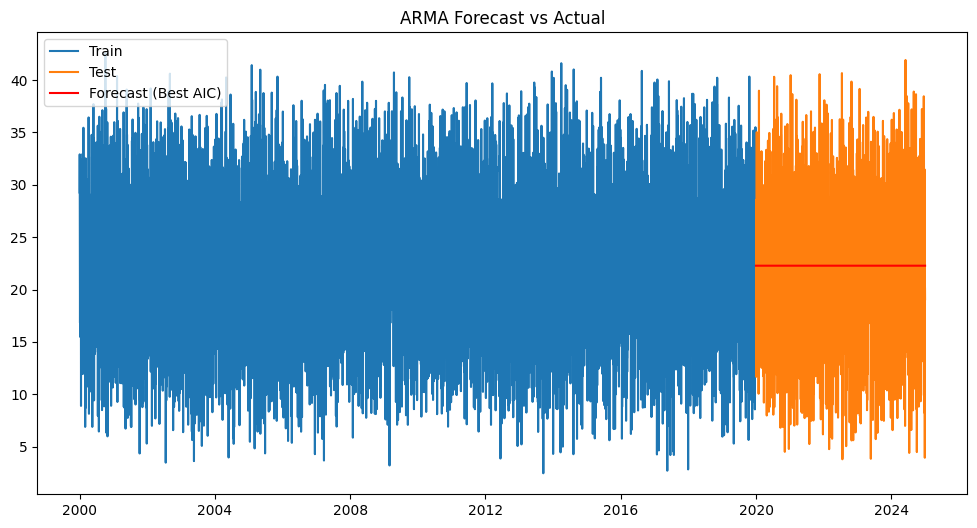

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Define parameter ranges
p_values = range(0, 4)
q_values = range(0, 4)

# Best tracking
best_aic = float('inf')
best_bic = float('inf')
best_order_aic = None
best_order_bic = None
best_model_aic = None
best_model_bic = None

results = []

for p in p_values:
    for q in q_values:
        try:
            model = ARIMA(train['Fire_Risk_Index'], order=(p, 0, q))
            model_fit = model.fit()
            aic = model_fit.aic
            bic = model_fit.bic
            results.append((p, q, aic, bic))
            print(f"ARMA({p},0,{q}) - AIC: {aic:.2f}, BIC: {bic:.2f}")

            if aic < best_aic:
                best_aic = aic
                best_order_aic = (p, 0, q)
                best_model_aic = model_fit

            if bic < best_bic:
                best_bic = bic
                best_order_bic = (p, 0, q)
                best_model_bic = model_fit

        except Exception as e:
            print(f"Failed ARMA({p},0,{q}): {e}")

# Summary
print("\nBest model by AIC:")
print(f"ARMA{best_order_aic} - AIC: {best_aic:.2f}")
print("\nBest model by BIC:")
print(f"ARMA{best_order_bic} - BIC: {best_bic:.2f}")

print(best_model_aic.summary())
# Forecast using best AIC model
forecast = best_model_aic.forecast(steps=len(test))
mse = mean_squared_error(test['Fire_Risk_Index'], forecast)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test['Fire_Risk_Index'], forecast)

# Results
print("\nBest model by AIC:")
print(f"ARMA{best_order_aic} - AIC: {best_aic:.2f}")
print(f"MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}")
# Plot
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['Fire_Risk_Index'], label='Train')
plt.plot(test.index, test['Fire_Risk_Index'], label='Test')
plt.plot(test.index, forecast, label='Forecast (Best AIC)', color='red')
plt.title('ARMA Forecast vs Actual')
plt.legend()
plt.show()


### *ARMAX model (by Vegetation Type)*


 Training ARMAX for Vegetation Type: Shrubland
                               SARIMAX Results                                
Dep. Variable:        Fire_Risk_Index   No. Observations:                 1826
Model:               SARIMAX(1, 0, 2)   Log Likelihood                3606.267
Date:                Sat, 19 Apr 2025   AIC                          -7196.535
Time:                        06:36:16   BIC                          -7152.469
Sample:                             0   HQIC                         -7180.279
                               - 1826                                         
Covariance Type:                  opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Temperature       0.4024      0.000   2726.668      0.000       0.402       0.403
Humidity         -0.3010   5.15e-05  -5842.517      0.000      -0.301     

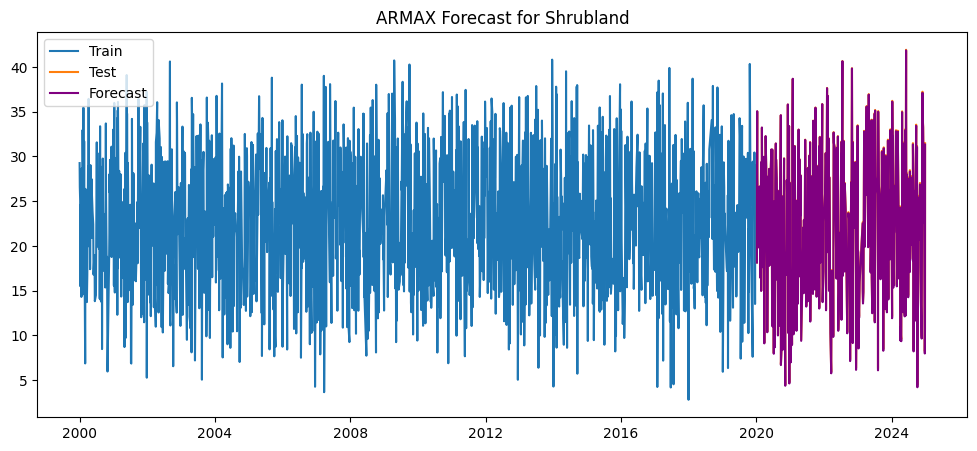


 Training ARMAX for Vegetation Type: Wetland
                               SARIMAX Results                                
Dep. Variable:        Fire_Risk_Index   No. Observations:                 1875
Model:               SARIMAX(1, 0, 2)   Log Likelihood                7870.569
Date:                Sat, 19 Apr 2025   AIC                         -15725.138
Time:                        06:36:21   BIC                         -15680.860
Sample:                             0   HQIC                        -15708.826
                               - 1875                                         
Covariance Type:                  opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Temperature       0.3996   1.38e-05   2.89e+04      0.000       0.400       0.400
Humidity         -0.3000   4.42e-06  -6.78e+04      0.000      -0.300      -

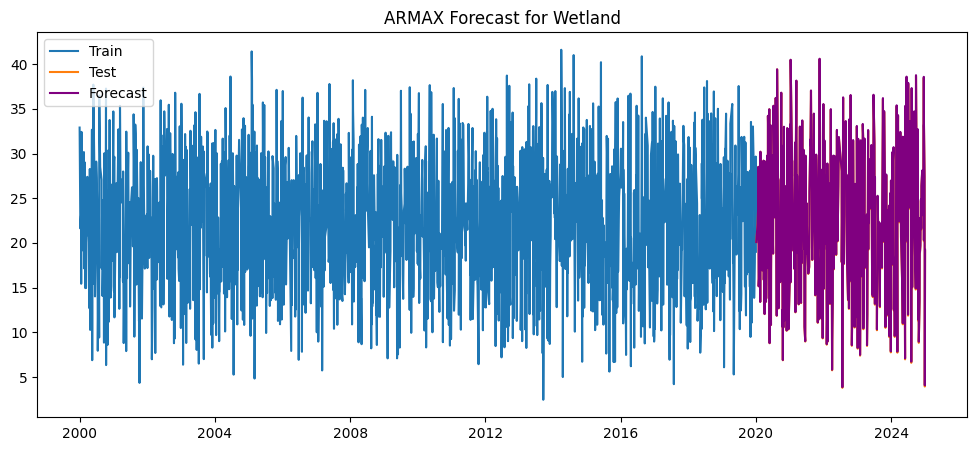


 Training ARMAX for Vegetation Type: Forest
                               SARIMAX Results                                
Dep. Variable:        Fire_Risk_Index   No. Observations:                 1766
Model:               SARIMAX(1, 0, 2)   Log Likelihood                9936.210
Date:                Sat, 19 Apr 2025   AIC                         -19856.420
Time:                        06:36:27   BIC                         -19812.622
Sample:                             0   HQIC                        -19840.236
                               - 1766                                         
Covariance Type:                  opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Temperature       0.4000   1.26e-06   3.18e+05      0.000       0.400       0.400
Humidity         -0.3000   4.66e-07  -6.43e+05      0.000      -0.300      -0

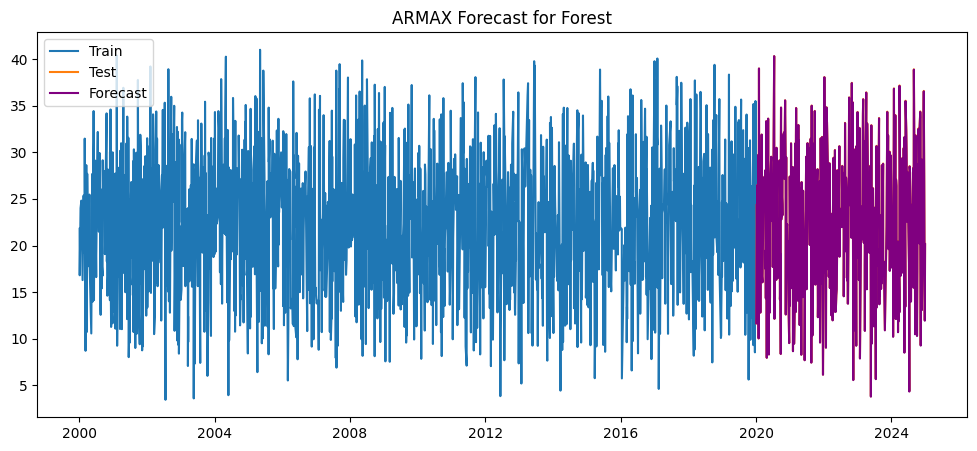


 Training ARMAX for Vegetation Type: Grassland
                               SARIMAX Results                                
Dep. Variable:        Fire_Risk_Index   No. Observations:                 1838
Model:               SARIMAX(1, 0, 2)   Log Likelihood                5479.139
Date:                Sat, 19 Apr 2025   AIC                         -10942.278
Time:                        06:36:32   BIC                         -10898.160
Sample:                             0   HQIC                        -10926.008
                               - 1838                                         
Covariance Type:                  opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Temperature       0.4000   1.58e-05   2.54e+04      0.000       0.400       0.400
Humidity         -0.3000   5.44e-06  -5.52e+04      0.000      -0.300     

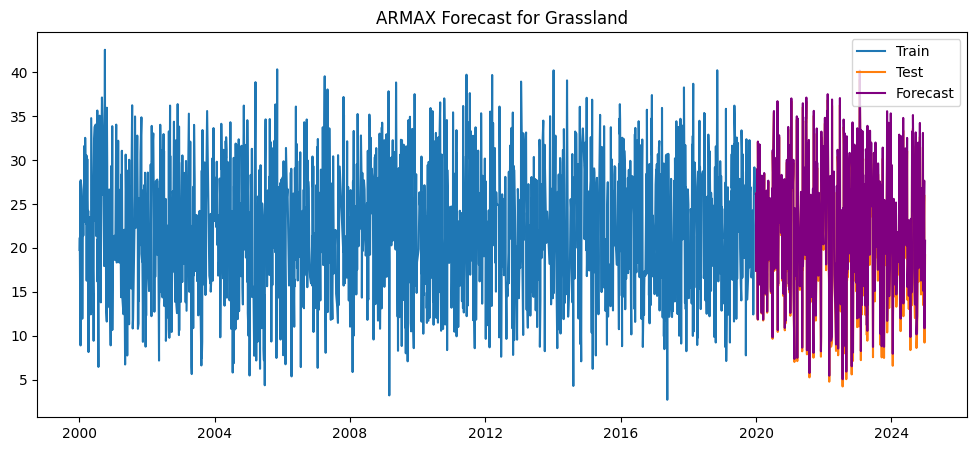

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import numpy as np


exog_vars = ['Temperature', 'Humidity', 'Wind_Speed', 'Precipitation']

vegetation_types = train['Vegetation_Type'].unique()


p, q = 1, 2

for veg in vegetation_types:
    print(f"\n Training ARMAX for Vegetation Type: {veg}")

    # Filter train/test for this vegetation type
    train_veg = train[train['Vegetation_Type'] == veg]
    test_veg = test[test['Vegetation_Type'] == veg]

    train_exog = train_veg[exog_vars]
    test_exog = test_veg[exog_vars]

    # Train ARMAX
    model_armax = SARIMAX(train_veg['Fire_Risk_Index'],
                          exog=train_exog,
                          order=(p, 0, q),
                          enforce_stationarity=False)

    model_armax_fit = model_armax.fit(disp=False)
    print(model_armax_fit.summary())

    # Forecast
    forecast = model_armax_fit.forecast(steps=len(test_veg), exog=test_exog)

    # Evaluation
    mse = mean_squared_error(test_veg['Fire_Risk_Index'], forecast)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(test_veg['Fire_Risk_Index'], forecast)

    print(f"Evaluation for {veg}:")
    print(f"MSE: {mse:.4f}, RMSE: {rmse:.4f}, MAE: {mae:.4f}")

    # Plot
    plt.figure(figsize=(12, 5))
    plt.plot(train_veg.index, train_veg['Fire_Risk_Index'], label='Train')
    plt.plot(test_veg.index, test_veg['Fire_Risk_Index'], label='Test')
    plt.plot(test_veg.index, forecast, label='Forecast', color='purple')
    plt.title(f'ARMAX Forecast for {veg}')
    plt.legend()
    plt.show()


### *ARMAX Model (with grid search)*
In such a model, the 'X' in ARMAX accounts for other variables apart from the lagged variables of Fire Risk Index.

p=0, q=0 -> AIC: 41878.4092, BIC: 41933.5786
p=0, q=1 -> AIC: 41860.7696, BIC: 41922.8340
p=0, q=2 -> AIC: 41852.5547, BIC: 41921.5137
p=1, q=0 -> AIC: 41864.8739, BIC: 41926.9395
p=1, q=1 -> AIC: 22632.9650, BIC: 22701.9254
p=1, q=2 -> AIC: 11317.1692, BIC: 11393.0241
p=2, q=0 -> AIC: 41858.3803, BIC: 41927.3407
p=2, q=1 -> AIC: 206.9698, BIC: 282.8262
p=2, q=2 -> AIC: -1384.1916, BIC: -1301.4408
Best ARMAX Model: p=2, q=2
Best AIC: -1384.1916
Best BIC: -1301.4408
Best ARMAX Model Evaluation: 
MSE: 0.0527
RMSE: 0.2297
MAE: 0.1903


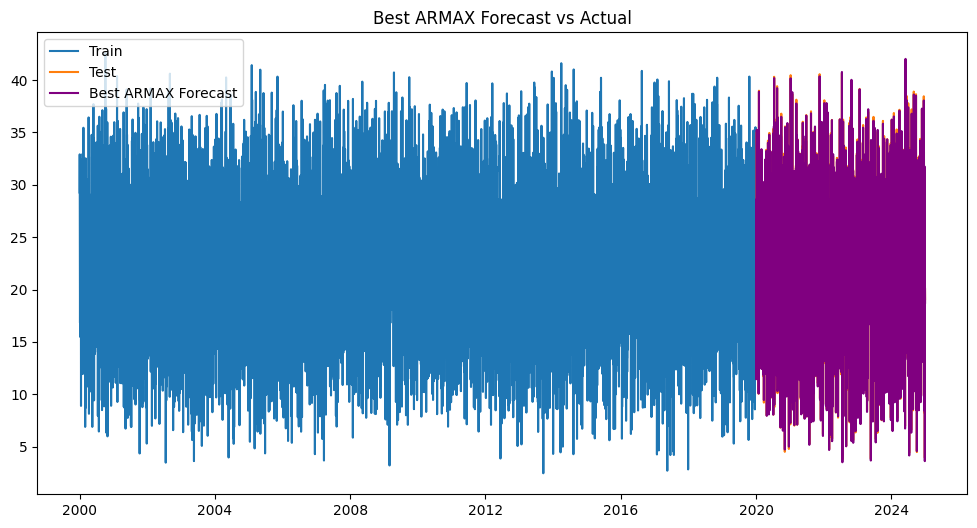

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('synthetic_wildfire_data.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
df_encoded = pd.get_dummies(df, columns=['Vegetation_Type'], drop_first=True)
df = df_encoded

# Setting the Exogenous and Secondary Target Variable (Fire_Risk_Index)
exog_vars = ['Temperature', 'Humidity', 'Wind_Speed', 'Precipitation', 'Vegetation_Type_Grassland',
             'Vegetation_Type_Shrubland', 'Vegetation_Type_Wetland']
target_var = 'Fire_Risk_Index'

# Spliting the data into train and test
train_size = int(len(df) * 0.8)
train = df.iloc[:train_size]
test = df.iloc[train_size:]

# Converting all variables into float type
train[exog_vars + [target_var]] = train[exog_vars + [target_var]].astype(float)
test[exog_vars + [target_var]] = test[exog_vars + [target_var]].astype(float)

train_exog = train[exog_vars]
test_exog = test[exog_vars]


# Define the range for p and q
p_values = range(0,3)
q_values = range(0,3)
best_aic = float('inf')  # To store the best AIC
best_bic = float('inf')  # To store the best BIC
best_p = None
best_q = None
best_model = None

# Grid search for best p and q using AIC and BIC
for p in p_values:
    for q in q_values:
        # Train ARMAX model
        model_armax = SARIMAX(train['Fire_Risk_Index'],
                              exog=train_exog,
                              order=(p, 0, q),  # d=0 for ARMAX
                              enforce_stationarity=False)
        model_armax_fit = model_armax.fit(disp=False)

        # Get the AIC and BIC values
        aic = model_armax_fit.aic
        bic = model_armax_fit.bic

        # Print current evaluation with AIC and BIC
        print(f"p={p}, q={q} -> AIC: {aic:.4f}, BIC: {bic:.4f}")

        # If the current model is better based on AIC or BIC, store the result
        if bic < best_bic:
            best_aic = aic
            best_bic = bic
            best_p = p
            best_q = q
            best_model = model_armax_fit

# Print the best parameters and model evaluation
print(f"Best ARMAX Model: p={best_p}, q={best_q}")
print(f"Best AIC: {best_aic:.4f}")
print(f"Best BIC: {best_bic:.4f}")

# Forecast using the best model
armax_forecast_best = best_model.forecast(steps=len(test), exog=test_exog)

# Final Evaluation for the best model
mse_best = mean_squared_error(test['Fire_Risk_Index'], armax_forecast_best)
rmse_best = np.sqrt(mse_best)
mae_best = mean_absolute_error(test['Fire_Risk_Index'], armax_forecast_best)

print(f"Best ARMAX Model Evaluation: ")
print(f"MSE: {mse_best:.4f}")
print(f"RMSE: {rmse_best:.4f}")
print(f"MAE: {mae_best:.4f}")

# Plot actual vs forecast for the best model
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['Fire_Risk_Index'], label='Train')
plt.plot(test.index, test['Fire_Risk_Index'], label='Test')
plt.plot(test.index, armax_forecast_best, label='Best ARMAX Forecast', color='purple')
plt.title('Best ARMAX Forecast vs Actual')
plt.legend()
plt.show()

##*ARMAX model plot diagnostics*

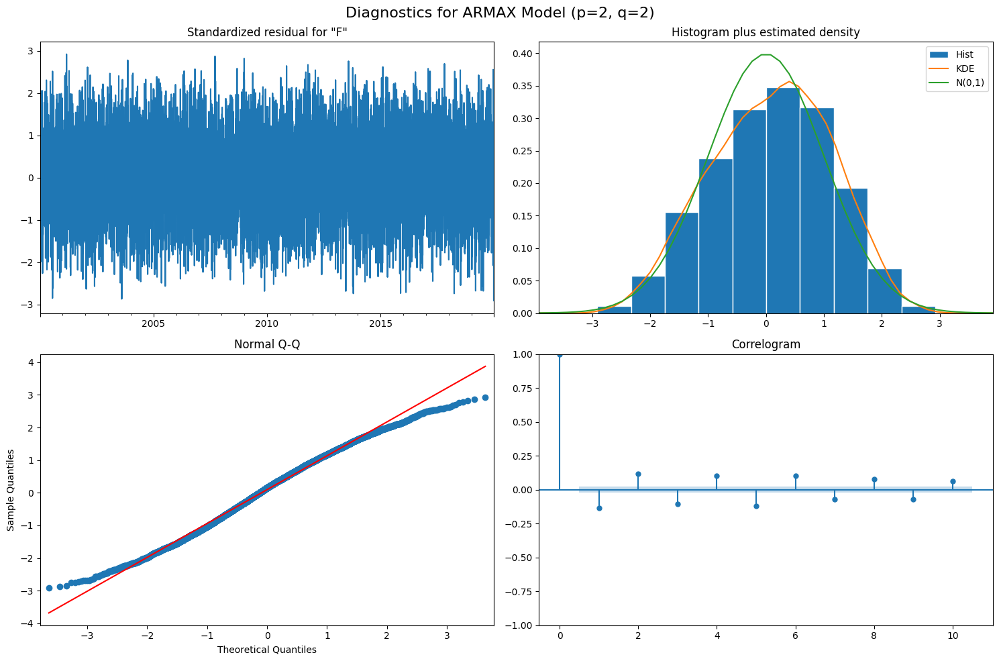

In [ ]:
best_model = SARIMAX(train['Fire_Risk_Index'],
                     exog=train_exog,
                     order=(best_p, 0, best_q),
                     enforce_stationarity=False)

best_model_fit = best_model.fit(disp=False)

# Plot diagnostics
best_model_fit.plot_diagnostics(figsize=(15, 10))
plt.suptitle(f'Diagnostics for ARMAX Model (p={best_p}, q={best_q})', fontsize=16)
plt.tight_layout()
plt.show()

### *SARMA Model*

                                     SARIMAX Results                                      
Dep. Variable:                    Fire_Risk_Index   No. Observations:                 7305
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 30)   Log Likelihood              -24813.763
Date:                            Sat, 19 Apr 2025   AIC                          49637.527
Time:                                    14:30:20   BIC                          49671.986
Sample:                                01-01-2000   HQIC                         49649.378
                                     - 12-31-2019                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5968      0.298      2.001      0.045       0.012       1.181
ma.L1         -0.6052      0.296   

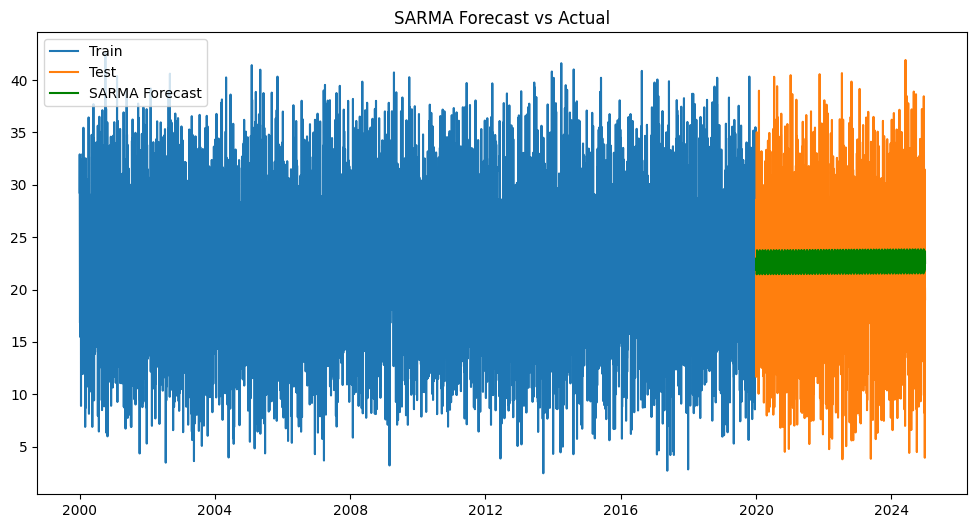

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# SARMA parameters
p, q = 1, 1       # Non-seasonal AR and MA orders
P, Q, s = 1, 1, 30  # Seasonal AR, MA orders and seasonal period
# Train SARMA model
model_sarma = SARIMAX(train['Fire_Risk_Index'],
                      order=(p, 0, q),            # d=0 for ARMA instead of ARIMA
                      seasonal_order=(P, 0, Q, s),  # D=0 for SARMA instead of SARIMA
                      enforce_stationarity=False)
model_sarma_fit = model_sarma.fit(disp=False)
print(model_sarma_fit.summary())

# Forecast
sarma_forecast = model_sarma_fit.forecast(steps=len(test))

# Evaluate
mse = mean_squared_error(test['Fire_Risk_Index'], sarma_forecast)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test['Fire_Risk_Index'], sarma_forecast)

print(f"SARMA Model Evaluation:")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")

# Plot actual vs forecast
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['Fire_Risk_Index'], label='Train')
plt.plot(test.index, test['Fire_Risk_Index'], label='Test')
plt.plot(test.index, sarma_forecast, label='SARMA Forecast', color='green')
plt.title('SARMA Forecast vs Actual')
plt.legend()
plt.show()

### *SARMAX Model*

                                     SARIMAX Results                                      
Dep. Variable:                    Fire_Risk_Index   No. Observations:                 7305
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 30)   Log Likelihood               36134.385
Date:                            Sat, 19 Apr 2025   AIC                         -72250.770
Time:                                    14:35:19   BIC                         -72188.743
Sample:                                01-01-2000   HQIC                        -72229.438
                                     - 12-31-2019                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Temperature       0.4001   2.13e-06   1.88e+05      0.000       0.400       0.400
Humidity         -0.3000  

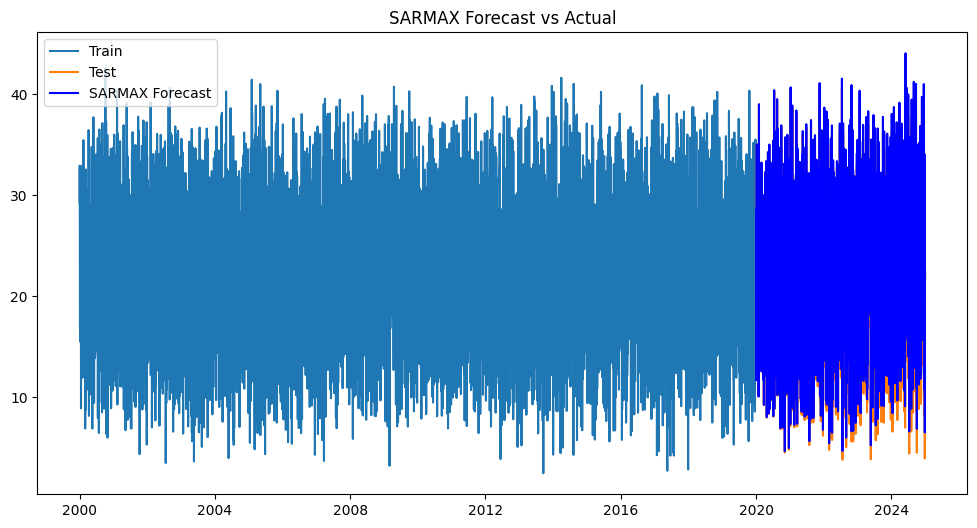

In [ ]:
# Select exogenous variables
exog_vars = ['Temperature', 'Humidity', 'Wind_Speed', 'Precipitation']
train_exog = train[exog_vars]
test_exog = test[exog_vars]

# SARMAX parameters
p, q = 1, 1       # Non-seasonal AR and MA orders
P, Q, s = 1, 1, 30  # Seasonal AR, MA orders and seasonal period

# Train SARMAX model
model_sarmax = SARIMAX(train['Fire_Risk_Index'],
                       exog=train_exog,
                       order=(p, 0, q),           # d=0 for ARMA instead of ARIMA
                       seasonal_order=(P, 0, Q, s),  # D=0 for seasonal component
                       enforce_stationarity=False)
model_sarmax_fit = model_sarmax.fit(disp=False)
print(model_sarmax_fit.summary())

# Forecast with exogenous variables
sarmax_forecast = model_sarmax_fit.forecast(steps=len(test), exog=test_exog)

# Evaluate
mse = mean_squared_error(test['Fire_Risk_Index'], sarmax_forecast)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test['Fire_Risk_Index'], sarmax_forecast)

print(f"SARMAX Model Evaluation:")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")

# Plot actual vs forecast
plt.figure(figsize=(12, 6))
plt.plot(train.index, train['Fire_Risk_Index'], label='Train')
plt.plot(test.index, test['Fire_Risk_Index'], label='Test')
plt.plot(test.index, sarmax_forecast, label='SARMAX Forecast', color='blue')
plt.title('SARMAX Forecast vs Actual')
plt.legend()
plt.show()

### *VAR Model*

Testing different lag values:
Lag 1: Error fitting model
Lag 2: Error fitting model
Lag 3: AIC = -54.7815
Lag 4: AIC = -19.2408
Lag 5: AIC = -20.7173
Lag 6: AIC = -18.9139
Lag 7: AIC = -17.3647
Lag 8: AIC = -15.9927
Lag 9: AIC = -19.4426
Lag 10: AIC = -25.6017

Optimal lag based on AIC: 3
AIC value: -54.7815
VAR Model trained with lag 3
Model Performance:
MSE: 54.7173
RMSE: 7.3971
R²: -0.0006


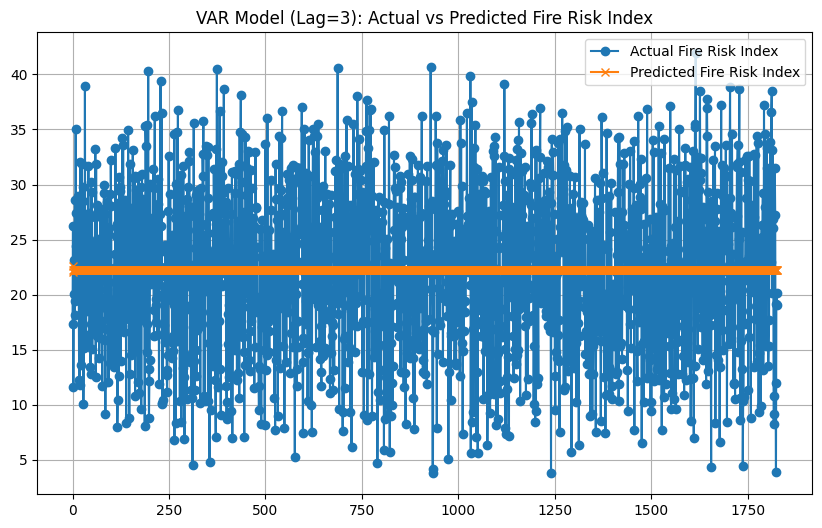

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.tsa.api import VAR
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Reloading the data without the encoding
df = pd.read_csv('synthetic_wildfire_data.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)


# Prepare the data for the VAR model
def prepare_data(df):
    # Create a copy of the dataframe
    data = df.copy()

    # Get continuous variables (exclude Fire_Occurrence and Fire_Risk_Index)
    continuous_vars = ['Temperature', 'Humidity', 'Wind_Speed', 'Precipitation']

    # Encoding the Vegetation_Type Variable
    encoder = OneHotEncoder(sparse_output=False)
    vegetation_encoded = encoder.fit_transform(data[['Vegetation_Type']])
    vegetation_cols = [f'Veg_{cat}' for cat in encoder.categories_[0]]
    vegetation_df = pd.DataFrame(vegetation_encoded, columns=vegetation_cols, index=data.index)

    continuous_df = data[continuous_vars]

    # Add Fire_Risk_Index to the continuous variables dataframe
    continuous_df['Fire_Risk_Index'] = data['Fire_Risk_Index']

    # Combine all features
    final_df = pd.concat([continuous_df, vegetation_df], axis=1)

    return final_df

# Since running higher lags is leading to an issue,
# we can set the model to reduce lags till
# an accurate performance metric can be elicited.

#This issue is occurring due to the size the data.
# While the model for the best lag is possible when
# using 70% of the data for test, such is not
# very feasible in training the model.


def select_optimal_lag(data, max_lag=10):
    # Create and fit VAR model
    model = VAR(data)

    # Store AIC values
    aic_values = {}

    # Try different lag orders
    print("Testing different lag values:")
    for lag in range(1, max_lag + 1):
        try:
            results = model.fit(lag)
            aic = results.aic
            aic_values[lag] = aic
            print(f"Lag {lag}: AIC = {aic:.4f}")
        except:
            print(f"Lag {lag}: Error fitting model")

    # Find the lag with minimum AIC
    optimal_lag = min(aic_values, key=aic_values.get)
    print(f"\nOptimal lag based on AIC: {optimal_lag}")
    print(f"AIC value: {aic_values[optimal_lag]:.4f}")


    return optimal_lag

# REPLACE YOUR CURRENT run_var_model FUNCTION WITH THIS ONE
def run_var_model(data, lag=None):
    # If lag is not provided, find the optimal lag
    if lag is None:
        lag = select_optimal_lag(data)

    # Split data into train and test sets (80-20 split)
    train_size = int(len(data) * 0.8)
    train_data = data.iloc[:train_size]
    test_data = data.iloc[train_size:]

    # Create and fit VAR model
    model = VAR(train_data)
    results = model.fit(lag)
    print(f"VAR Model trained with lag {lag}")

    # Get the lag order used
    lag_order = results.k_ar

    # Make forecasts
    input_data = train_data.values[-lag_order:]  # Use the last lag_order values from train_data
    forecast_steps = len(test_data)
    forecasts = results.forecast(input_data, forecast_steps)

    # Convert forecasts to DataFrame
    forecast_df = pd.DataFrame(forecasts, columns=test_data.columns, index=test_data.index)

    # Check for NaN values in predictions
    if forecast_df['Fire_Risk_Index'].isna().any():
        print("Warning: Forecast contains NaN values. Trying smaller lag...")
        # Try with a smaller lag value if optimal lag produces NaNs
        if lag > 1:
            return run_var_model(data, lag=lag-1)
        else:
            print("Cannot reduce lag further. Consider checking your data.")
            return results

    # Evaluate predictions for Fire_Risk_Index
    actual = test_data['Fire_Risk_Index'].values
    predicted = forecast_df['Fire_Risk_Index'].values

    # Calculate error metrics
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    r2 = r2_score(actual, predicted)

    print(f"Model Performance:")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R²: {r2:.4f}")

    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual Fire Risk Index', marker='o')
    plt.plot(predicted, label='Predicted Fire Risk Index', marker='x')
    plt.title(f'VAR Model (Lag={lag}): Actual vs Predicted Fire Risk Index')
    plt.legend()
    plt.grid(True)
    plt.show()

    return results
# To use this code with your data:
# 1. Prepare the data
prepared_data = prepare_data(df)

# 2. Train the model with automatic lag selection
var_model = run_var_model(prepared_data)

## Modeling on the Residuals
The results above, along with the RMSE scores show that the ARMAX model would be most accurate.

Given that much of the data is already being explained by the ARMAX model, we decided to understand whether the the ARCH or GARCH models can be applied to the residuals. The ARCH test can be executed on the residuals of the model to recongnise the need for an ARCH or GARCH model.

In [ ]:
# Get residuals from your fitted ARMAX model
residuals = model_armax_fit.resid

# Perform the ARCH test (lag = 10 is common, can be tuned)
arch_test = het_arch(residuals, nlags=10)

print("ARCH Test Results:")
print(f"LM Statistic: {arch_test[0]:.4f}")
print(f"p-value: {arch_test[1]:.4f}")
print(f"F-statistic: {arch_test[2]:.4f}")
print(f"F p-value: {arch_test[3]:.4f}")

ARCH Test Results:
LM Statistic: 33.2881
p-value: 0.0002
F-statistic: 3.3390
F p-value: 0.0002


### *ARCH Model*

            Fire_Risk_Index  Fire_Risk_Log_Return
Date                                             
2000-01-03           26.601             -0.212767
2000-01-04           21.798             -0.199131
2000-01-05           16.816             -0.259487
2000-01-06           19.758              0.161228
2000-01-07           25.053              0.237435
Best ARCH Model: ARCH(1)
Best AIC: 13978.903142181565
                       Constant Mean - ARCH Model Results                       
Dep. Variable:     Fire_Risk_Log_Return   R-squared:                       0.000
Mean Model:               Constant Mean   Adj. R-squared:                  0.000
Vol Model:                         ARCH   Log-Likelihood:               -6986.45
Distribution:                    Normal   AIC:                           13978.9
Method:              Maximum Likelihood   BIC:                           14000.3
                                          No. Observations:                 9130
Date:                  Fri, A

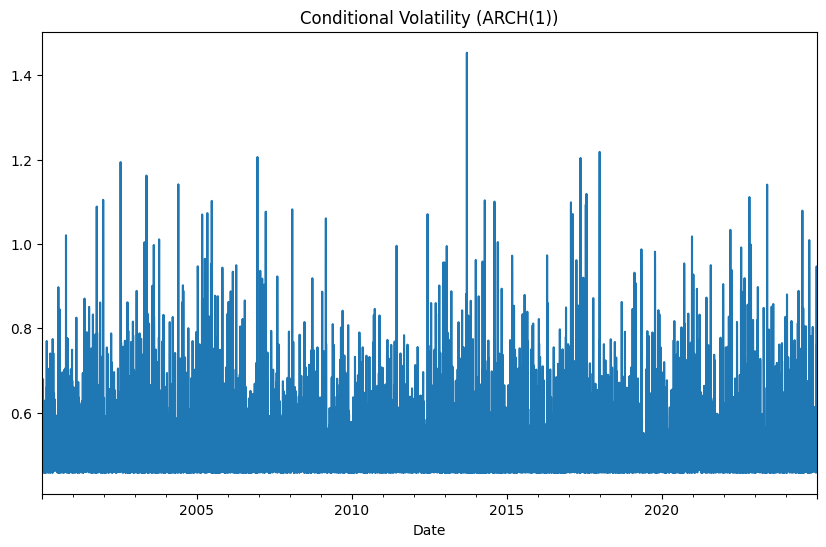

In [ ]:
#ARCH MODEL

# Assuming df is already loaded and contains the 'Fire_Risk_Index' column
df['Fire_Risk_Log_Return'] = np.log(df['Fire_Risk_Index'] / df['Fire_Risk_Index'].shift(1))

# Drop the first row with NaN value after the shift
df = df.dropna(subset=['Fire_Risk_Log_Return'])

# Inspect the log returns
print(df[['Fire_Risk_Index', 'Fire_Risk_Log_Return']].head())



# Function to fit ARCH model with different lags
def fit_arch(returns, max_p=5):
    best_aic = np.inf  # Initialize the best AIC to a very large number
    best_p = 0  # To store the best lag
    best_model = None  # To store the best model

    # Iterate through different lags for p (ARCH order)
    for p in range(1, max_p + 1):
        model = arch_model(returns, vol='ARCH', p=p)  # Correct way to initialize the model
        model_fit = model.fit(disp="off")  # Fit the model without printing the output
        aic = model_fit.aic  # AIC of the model

        # Update best model if we find a model with lower AIC
        if aic < best_aic:
            best_aic = aic
            best_p = p
            best_model = model_fit

    # Return the best model and its AIC
    return best_model, best_p, best_aic

# Fit the best ARCH model based on AIC for Fire_Risk_Log_Return
best_arch_model, best_p, best_aic = fit_arch(df['Fire_Risk_Log_Return'])

# Print the results
print(f"Best ARCH Model: ARCH({best_p})")
print(f"Best AIC: {best_aic}")
print(best_arch_model.summary())


# Forecasting the next 5 days of volatility
forecast_arch = best_arch_model.forecast(horizon=5)
print(forecast_arch.variance[-1:])  # Variance (volatility) forecast for the next 5 periods

# Plot conditional volatility of the best model
volatility = best_arch_model.conditional_volatility
volatility.plot(figsize=(10, 6))
plt.title(f"Conditional Volatility (ARCH({best_p}))")
plt.show()


### *GARCH Model*

            Fire_Risk_Index  Fire_Risk_Log_Return
Date                                             
2000-01-02           32.908              0.117460
2000-01-03           26.601             -0.212767
2000-01-04           21.798             -0.199131
2000-01-05           16.816             -0.259487
2000-01-06           19.758              0.161228
Iteration:      1,   Func. Count:      6,   Neg. LLF: 1111683.5676587555
Iteration:      2,   Func. Count:     16,   Neg. LLF: 5233678.051094717
Iteration:      3,   Func. Count:     23,   Neg. LLF: 7785.645133054271
Iteration:      4,   Func. Count:     30,   Neg. LLF: 6998.294251471811
Iteration:      5,   Func. Count:     35,   Neg. LLF: 6999.616737029076
Iteration:      6,   Func. Count:     41,   Neg. LLF: 7689.844611340337
Iteration:      7,   Func. Count:     48,   Neg. LLF: 6986.479321634602
Iteration:      8,   Func. Count:     53,   Neg. LLF: 6986.477214539588
Iteration:      9,   Func. Count:     58,   Neg. LLF: 6986.477176481058
I

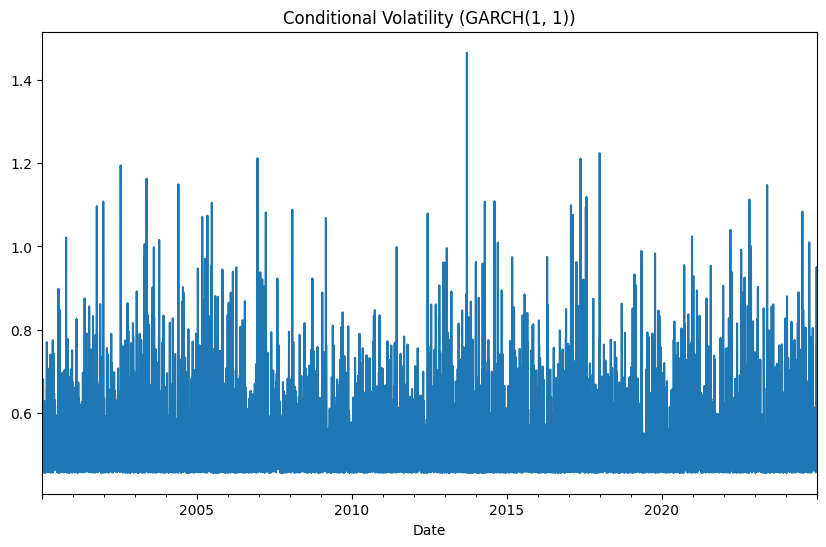

In [ ]:
#GARCH MODEL
# Calculate log returns of the Fire_Risk_Index
df['Fire_Risk_Log_Return'] = np.log(df['Fire_Risk_Index'] / df['Fire_Risk_Index'].shift(1))

# Drop the first row with NaN value after shift
df = df.dropna(subset=['Fire_Risk_Log_Return'])

# Inspect the log returns
print(df[['Fire_Risk_Index', 'Fire_Risk_Log_Return']].head())


# Fit a GARCH(1,1) model to the log returns of Fire_Risk_Index
garch_model = arch_model(df['Fire_Risk_Log_Return'], vol='Garch', p=1, q=1)
garch_fit = garch_model.fit()

# Print the results
print(garch_fit.summary())


# Function to fit GARCH model with different lags
def fit_garch(returns, max_p=5, max_q=5):
    best_aic = np.inf  # Initialize the best AIC to a very large number
    best_p, best_q = 0, 0  # To store the best lag combination
    best_model = None  # To store the best model

    # Iterate through different lags for p (ARCH) and q (GARCH)
    for p in range(1, max_p + 1):
        for q in range(1, max_q + 1):
            model = arch_model(returns, vol='Garch', p=p, q=q)
            model_fit = model.fit(disp="off")  # Fit the model without printing the output
            aic = model_fit.aic  # AIC of the model

            # Update best model if we find a model with lower AIC
            if aic < best_aic:
                best_aic = aic
                best_p, best_q = p, q
                best_model = model_fit

    # Return the best model and its AIC
    return best_model, best_p, best_q, best_aic

# Fit the best GARCH model based on AIC for Fire_Risk_Log_Return
best_garch_model, best_p, best_q, best_aic = fit_garch(df['Fire_Risk_Log_Return'])

# Print the results
print(f"Best GARCH Model: GARCH({best_p}, {best_q})")
print(f"Best AIC: {best_aic}")
print(best_garch_model.summary())


# Forecasting the next 5 days of volatility
forecast = best_garch_model.forecast(horizon=5)
print(forecast.variance[-1:])  # Variance (volatility) forecast for the next 5 periods

# Plot conditional volatility of the best model
volatility = best_garch_model.conditional_volatility
volatility.plot(figsize=(10, 6))
plt.title(f"Conditional Volatility (GARCH({best_p}, {best_q}))")
plt.show()

Based on AIC and BIC scores of both models, we can confirm that the ARCH model would provide the best results.

## Accurately Predicting Fire_Risk_Index

Hence, a model that combines ARMAX along with ARCH on its residuals would provide the most accurate predictions. Such an accuracy would be essential in classifying the binary target variable (Fire Occurence).

Therefore, the following code automates the process of developing such a model wherein the best parameters for both models are chosen based on the AIC score.

Optimizing ARMAX(p, q)...
Best ARMAX order: (p=2, q=2), AIC=-1384.19

 Optimizing ARCH(p)...
Best ARCH order: p=2, AIC=-1379.08
Evaluation Metrics:
RMSE: 0.2297
MAE: 0.1903


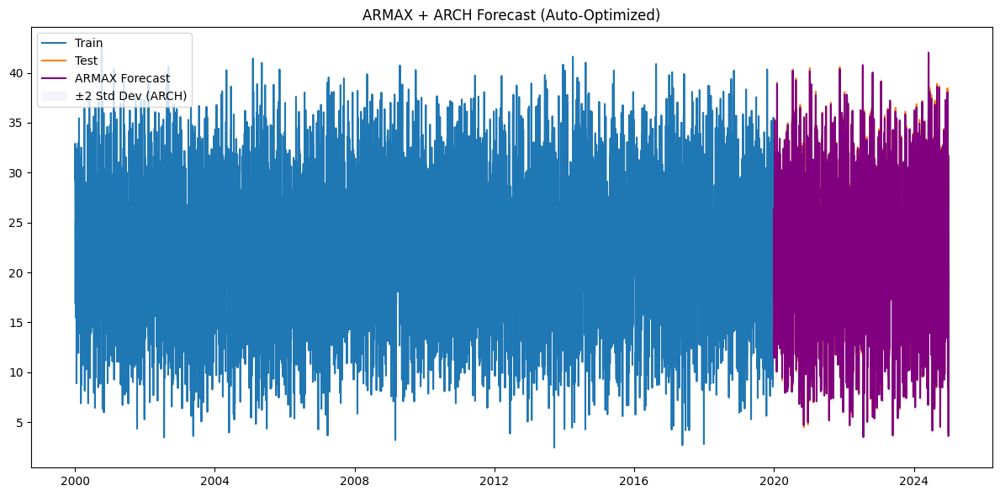

In [ ]:
#PART A: PREPROCESSING THE DATA

# Loading the Data and Encoding the Categorical Variable
df = pd.read_csv('synthetic_wildfire_data.csv')
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)
df_encoded = pd.get_dummies(df, columns=['Vegetation_Type'], drop_first=True)
df = df_encoded

# Setting the Exogenous and Secondary Target Variable (Fire_Risk_Index)
exog_vars = ['Temperature', 'Humidity', 'Wind_Speed', 'Precipitation', 'Vegetation_Type_Grassland',
             'Vegetation_Type_Shrubland', 'Vegetation_Type_Wetland']
target_var = 'Fire_Risk_Index'

# Spliting the data into train and test
train_size = int(len(df) * 0.8)
train = df.iloc[:train_size]
test = df.iloc[train_size:]

# Converting all variables into float type
train[exog_vars + [target_var]] = train[exog_vars + [target_var]].astype(float)
test[exog_vars + [target_var]] = test[exog_vars + [target_var]].astype(float)

train_exog = train[exog_vars]
test_exog = test[exog_vars]



# PART B: RUNNING THE MODEL

# Running the ARMAX + ARCH Model
def forecast_armax_arch_auto(train, test, exog_vars, target_var,
                              max_ar=3, max_ma=3, max_arch_p=3):
    """
    Automatically selects best ARMAX(p,q) and ARCH(p) model using AIC,
    then forecasts mean + volatility.

    Returns:
    - armax_forecast: Point forecast
    - arch_vol_forecast: Forecasted std dev
    """
    warnings.filterwarnings("ignore")

    print("Optimizing ARMAX(p, q)...")
    best_aic = np.inf
    best_order = None
    best_armax_fit = None

    for p in range(max_ar + 1):
        for q in range(max_ma + 1):
            if p == 0 and q == 0:
                continue
            try:
                model = SARIMAX(train[target_var],
                                exog=train[exog_vars],
                                order=(p, 0, q),
                                enforce_stationarity=False)
                fit = model.fit(disp=False)
                if fit.aic < best_aic:
                    best_aic = fit.aic
                    best_order = (p, q)
                    best_armax_fit = fit
            except:
                continue

    p_opt, q_opt = best_order
    print(f"Best ARMAX order: (p={p_opt}, q={q_opt}), AIC={best_aic:.2f}")

    armax_forecast = best_armax_fit.forecast(steps=len(test), exog=test[exog_vars])
    residuals = best_armax_fit.resid

    print("\n Optimizing ARCH(p)...")
    best_arch_aic = np.inf
    best_arch_p = None
    best_arch_fit = None

    for p in range(1, max_arch_p + 1):
        try:
            arch_model_spec = arch_model(residuals, vol='Arch', p=p)
            arch_fit = arch_model_spec.fit(disp='off')
            if arch_fit.aic < best_arch_aic:
                best_arch_aic = arch_fit.aic
                best_arch_p = p
                best_arch_fit = arch_fit
        except:
            continue

    arch_forecast = best_arch_fit.forecast(horizon=len(test))
    arch_vol_forecast = np.sqrt(arch_forecast.variance.values[-1, :])

    actual = test[target_var]
    mse = mean_squared_error(actual, armax_forecast)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, armax_forecast)

    print(f"Best ARCH order: p={best_arch_p}, AIC={best_arch_aic:.2f}")
    print(f"Evaluation Metrics:")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")

    plt.figure(figsize=(12, 6))
    plt.plot(train.index, train[target_var], label='Train')
    plt.plot(test.index, actual, label='Test')
    plt.plot(test.index, armax_forecast, label='ARMAX Forecast', color='purple')
    plt.fill_between(test.index,
                     armax_forecast - 2 * arch_vol_forecast,
                     armax_forecast + 2 * arch_vol_forecast,
                     color='lavender', alpha=0.4, label='±2 Std Dev (ARCH)')
    plt.title('ARMAX + ARCH Forecast (Auto-Optimized)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return armax_forecast, arch_vol_forecast, best_order, best_arch_p




armax_pred, arch_std, armax_order, arch_order = forecast_armax_arch_auto(
    train=train,
    test=test,
    exog_vars=exog_vars,
    target_var=target_var,
    max_ar=3,
    max_ma=3,
    max_arch_p=3
)


This combined model provides accurate results, with the RMSE of the testing section at 0.2297 and an AIC of 1384.19. Given these results, we can apply models to classify the Fire Occurrence variable and accurately predict a fire.

## Classification of Fire Occurrence

### *Threshold using Youden's J*
Here, we use the Youden's J statistic, a single statistic that captures the performance of a dichotomous diagnostic test, as a metric to understand the threshold that can be set to differentiate the binary features of Fire Occurrence.

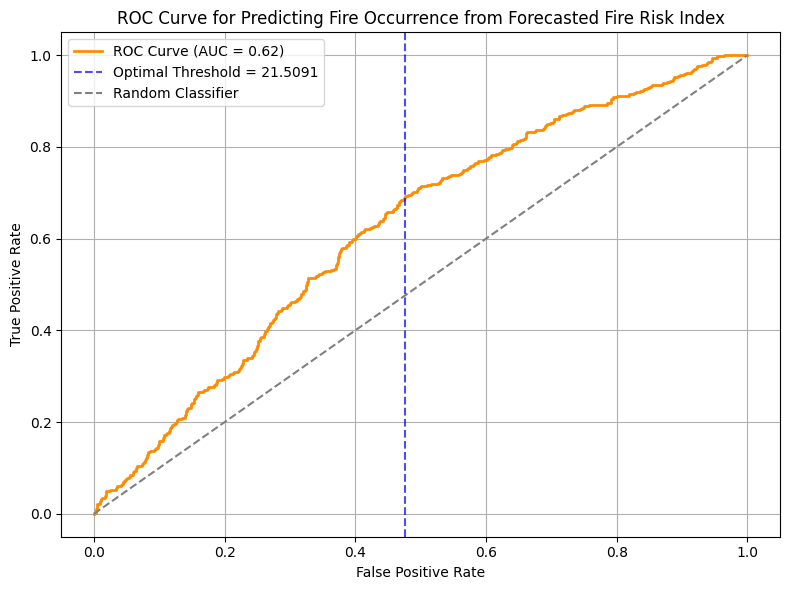

AUC Score: 0.6220
Optimal Threshold (Youden’s J): 21.5091

Confusion Matrix:
[[728 663]
 [134 302]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.52      0.65      1391
           1       0.31      0.69      0.43       436

    accuracy                           0.56      1827
   macro avg       0.58      0.61      0.54      1827
weighted avg       0.72      0.56      0.59      1827



In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, classification_report

# Step 1: Get actual binary outcomes
y_true_y = test['Fire_Occurrence'].values

# Step 2: Use ARMAX forecasted Fire_Risk_Index as risk scores
y_scores_y = armax_pred.values

# Step 3: Get ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_true_y, y_scores_y)
auc_score_y = roc_auc_score(y_true_y, y_scores_y)

# Step 4: Select optimal threshold using Youden's J statistic (J = TPR - FPR)
youden_index = tpr - fpr
optimal_idx = np.argmax(youden_index)
optimal_threshold = thresholds[optimal_idx]

# Step 5: Classify based on threshold
y_pred = (y_scores_y >= optimal_threshold).astype(int)

# Step 6: Evaluation metrics
conf_matrix = confusion_matrix(y_true_y, y_pred)
class_report = classification_report(y_true_y, y_pred)

# Step 7: Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score_y:.2f})', color='darkorange', lw=2)
plt.axvline(fpr[optimal_idx], color='blue', linestyle='--', alpha=0.7, label=f'Optimal Threshold = {optimal_threshold:.4f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Predicting Fire Occurrence from Forecasted Fire Risk Index')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Step 8: Print everything
print(f"AUC Score: {auc_score_y:.4f}")
print(f"Optimal Threshold (Youden’s J): {optimal_threshold:.4f}\n")
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Given the results of the threshold from the previous model, we can confirm that the simple setting of a threshold is not enough to accurately classify the target variable. Hence, models that integrate these predictions along with the actual values of the continuous and categorical environmental variables will be required.

(Note: The assumption here is that the Fire Risk Index i sbeing predicted, but the other environmental variables are being seen as 'real-time' data that is being integrated into the model)

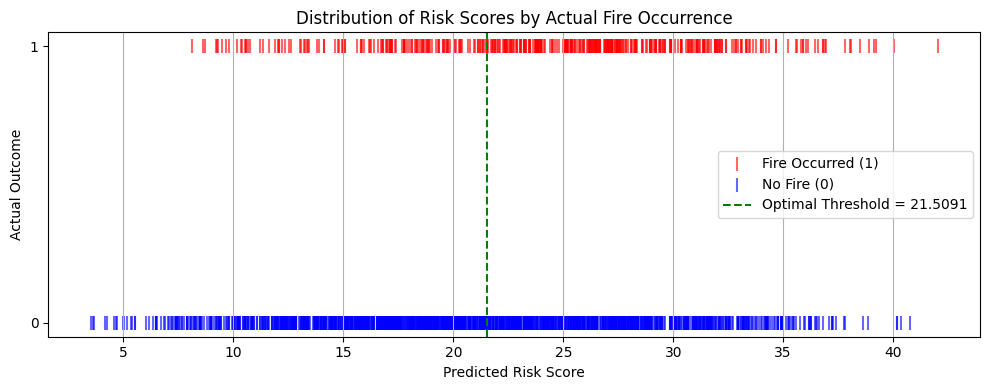

In [ ]:
plt.figure(figsize=(10, 4))

# Get indices for positive and negative cases
positive_indices = np.where(y_true_y == 1)[0]
negative_indices = np.where(y_true_y == 0)[0]

# Plot the risk scores as points on a line
plt.scatter(y_scores_y[positive_indices], np.ones_like(positive_indices)*0.1,
           color='red', alpha=0.6, label='Fire Occurred (1)', marker='|', s=100)
plt.scatter(y_scores_y[negative_indices], np.zeros_like(negative_indices),
           color='blue', alpha=0.6, label='No Fire (0)', marker='|', s=100)

# Add the optimal threshold as a vertical line
plt.axvline(x=optimal_threshold, color='green', linestyle='--',
           label=f'Optimal Threshold = {optimal_threshold:.4f}')

# Customize the plot
plt.yticks([0, 0.1], ['0', '1'])
plt.xlabel('Predicted Risk Score')
plt.ylabel('Actual Outcome')
plt.title('Distribution of Risk Scores by Actual Fire Occurrence')
plt.legend()
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

### *Logistic Regression Model*

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.47      0.61      1391
           1       0.30      0.72      0.42       436

    accuracy                           0.53      1827
   macro avg       0.57      0.60      0.51      1827
weighted avg       0.71      0.53      0.56      1827

Confusion Matrix:
 [[657 734]
 [123 313]]


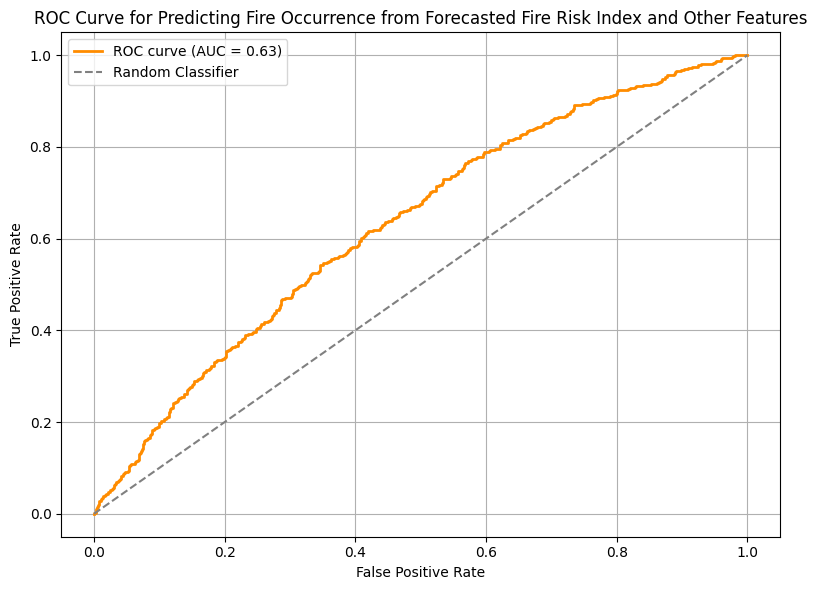

AUC Score for Fire Occurrence Prediction using Forecasted Fire Risk Index and Other Features: 0.6327
Precision: 0.29894937917860553
Recall: 0.7178899082568807
F1 score 0.42211732973701954


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score,roc_auc_score,f1_score
# Get actual fire occurrence for the test period
y_true_log = test['Fire_Occurrence'].values  # Binary target variable for fire occurrence

# Use ARMAX forecasted Fire_Risk_Index along with other continuous variables as features for logistic regression
# Including 'Temperature', 'Humidity', 'Wind_Speed', 'Precipitation' from the test set
X = np.column_stack([armax_pred.values,
                    test[exog_vars].values])

# Train logistic regression model
log_reg_model = LogisticRegression(solver='liblinear', class_weight={0:1, 1:3.7})
log_reg_model.fit(X, y_true_log)

# Predict fire occurrence
y_pred_log = log_reg_model.predict(X)

# Evaluate performance
print("Classification Report:\n", classification_report(y_true_log, y_pred_log))
print("Confusion Matrix:\n", confusion_matrix(y_true_log, y_pred_log))

# ROC curve and AUC for evaluating the model
y_scores_log = log_reg_model.predict_proba(X)[:, 1]  # Get the probability scores for the positive class
fpr, tpr, thresholds = roc_curve(y_true_log, y_scores_log)
auc_score_log = roc_auc_score(y_true_log, y_scores_log)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc_score_log:.2f})', color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Predicting Fire Occurrence from Forecasted Fire Risk Index and Other Features')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Print AUC Score
print(f"AUC Score for Fire Occurrence Prediction using Forecasted Fire Risk Index and Other Features: {auc_score_log:.4f}")
print("Precision:", precision_score(y_true_log, y_pred_log))
print("Recall:", recall_score(y_true_log, y_pred_log))
print("F1 score", f1_score(y_true_log, y_pred_log))

### *Random Forest*
Given that we are trying to classify the target variable, a Machine Learning model like Random Forest might help in proving accurate and robust results.

Random Forest AUC: 0.6130
Optimal Threshold (Youden’s J): 0.47
Classification Report (Random Forest with Optimized Threshold):
              precision    recall  f1-score   support

     No Fire       0.83      0.56      0.67      1391
        Fire       0.31      0.64      0.42       436

    accuracy                           0.58      1827
   macro avg       0.57      0.60      0.54      1827
weighted avg       0.71      0.58      0.61      1827

Precision: 0.3128491620111732
Recall: 0.6422018348623854
F1 score 0.42073628850488354


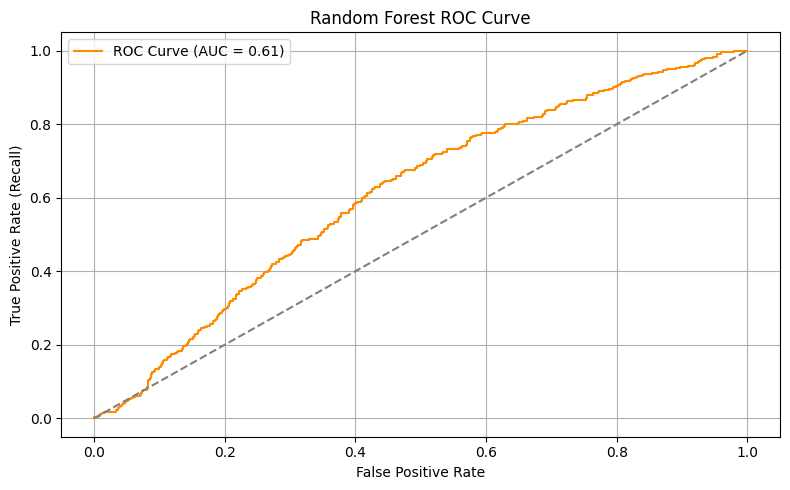

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score,roc_auc_score,f1_score

# Define features for classification
features_for_classification = ['Fire_Risk_Index'] + exog_vars
# Add the predicted Fire_Risk_Index to the test set
test = test.copy()
test['Predicted_Fire_Risk_Index'] = armax_pred

# Define X and y for training (use actual Fire_Risk_Index)
X_train = train[features_for_classification]
y_train_rf = train['Fire_Occurrence']  # Target is binary

# Define X and y for testing (use predicted Fire_Risk_Index)
X_test = test.copy()
X_test = X_test.drop(columns=['Fire_Risk_Index'])  # Drop actual Fire_Risk_Index to avoid leakage
X_test = X_test.rename(columns={'Predicted_Fire_Risk_Index': 'Fire_Risk_Index'})
X_test = X_test[features_for_classification]  # Ensure column order is consistent
y_test_rf = test['Fire_Occurrence']



from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, classification_report, roc_curve
import matplotlib.pyplot as plt
import numpy as np

# Train the model
rf_model = RandomForestClassifier(
    class_weight='balanced',
    n_estimators=200,
    max_depth=6,
    random_state=42
)
rf_model.fit(X_train, y_train_rf)

# Predict probabilities
y_proba_rf = rf_model.predict_proba(X_test)[:, 1]

# AUC Score
auc_rf = roc_auc_score(y_test_rf, y_proba_rf)
print(f"Random Forest AUC: {auc_rf:.4f}")

# Optimize threshold to favor recall for 'Fire'
fpr, tpr, thresholds = roc_curve(y_test_rf, y_proba_rf)
optimal_idx = np.argmax(tpr - fpr)  # You can also use a custom rule for recall prioritization
optimal_threshold = thresholds[optimal_idx]
print(f"Optimal Threshold (Youden’s J): {optimal_threshold:.2f}")

# Apply threshold to get predicted classes
y_pred_rf_opt = (y_proba_rf >= optimal_threshold).astype(int)

# Classification report
print("Classification Report (Random Forest with Optimized Threshold):")
print(classification_report(y_test_rf, y_pred_rf_opt, target_names=['No Fire', 'Fire']))
print("Precision:", precision_score(y_test_rf, y_pred_rf_opt))
print("Recall:", recall_score(y_test_rf, y_pred_rf_opt))
print("F1 score", f1_score(y_test_rf, y_pred_rf_opt))
# Plot ROC curve
plt.figure(figsize=(8, 5))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_rf:.2f})', color='darkorange')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate (Recall)')
plt.title('Random Forest ROC Curve')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### *SVM*

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Prepare the data
y_test_binary_svm = test['Fire_Occurrence'].values

# Add predicted risk index to test features
X_test_svm = test[exog_vars].copy()
X_test_svm['Predicted_Fire_Risk_Index'] = armax_pred

X_train_svm = train[exog_vars].copy()
X_train_svm['Predicted_Fire_Risk_Index'] = train[target_var]

y_train_binary_svm = train['Fire_Occurrence'].values

# Standardize features (critical for SVM)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_svm)
X_test_scaled = scaler.transform(X_test_svm)

# Calculate class weights to handle imbalance
classes = np.unique(y_train_binary_svm)
class_weights = compute_class_weight('balanced', classes=classes, y=y_train_binary_svm)
class_weight_dict = {0: class_weights[0], 1: class_weights[1]}

# Create and train SVM model with chosen parameters
# Using common good defaults for wildfire prediction
svm_model = SVC(
    C=10,                     # Regularization parameter
    kernel='rbf',             # Radial basis function kernel
    gamma='scale',            # Kernel coefficient
    probability=True,         # Enable probability estimates
    class_weight=class_weight_dict,  # Handle class imbalance
    random_state=42           # For reproducibility
)

print("Training SVM model...")
svm_model.fit(X_train_scaled, y_train_binary_svm)

# Make predictions
y_pred_binary_svm = svm_model.predict(X_test_scaled)
y_pred_prob_svm = svm_model.predict_proba(X_test_scaled)[:, 1]

# Calculate metrics
auc_score_svm = roc_auc_score(y_test_binary_svm, y_pred_prob_svm)

print("\nConfusion Matrix:")
print(confusion_matrix(y_test_binary_svm, y_pred_binary_svm))
print("\nClassification Report:")
print(classification_report(y_test_binary_svm, y_pred_binary_svm))
print("Precision:", precision_score(y_test_binary_svm, y_pred_binary_svm))
print("Recall:", recall_score(y_test_binary_svm, y_pred_binary_svm))
print("AUC:", auc_score_svm)

Training SVM model...

Confusion Matrix:
[[785 606]
 [190 246]]

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.56      0.66      1391
           1       0.29      0.56      0.38       436

    accuracy                           0.56      1827
   macro avg       0.55      0.56      0.52      1827
weighted avg       0.68      0.56      0.60      1827

Precision: 0.2887323943661972
Recall: 0.5642201834862385
AUC: 0.5869020373436047


###*XGBoost*

In [ ]:
#using class weights
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score,roc_auc_score,f1_score
from collections import Counter

# Getting true labels
y_test_binary_xgb = test['Fire_Occurrence'].values

# Adding predicted fire risk index
X_test_xgb = test[exog_vars].copy()
X_test_xgb['Predicted_Fire_Risk_Index'] = armax_pred

X_train_xgb = train[exog_vars].copy()
X_train_xgb['Predicted_Fire_Risk_Index'] = train[target_var]
y_train_binary_xgb = train['Fire_Occurrence'].values

# Calculate class imbalance ratio
counter = Counter(y_train_binary_xgb)
neg, pos = counter[0], counter[1]
scale_pos_weight = neg / pos

# Train XGBoost with class weight
xgb_clf = xgb.XGBClassifier(
    use_label_encoder=False,
    eval_metric='logloss',
    scale_pos_weight=scale_pos_weight
)
xgb_clf.fit(X_train_xgb, y_train_binary_xgb)

# Predict and evaluate
y_pred_binary_xgb = xgb_clf.predict(X_test_xgb)
y_pred_prob_xgb = xgb_clf.predict_proba(X_test_xgb)[:, 1]
auc_score_xgb = roc_auc_score(y_test_binary_xgb, y_pred_prob_xgb)


print("Confusion Matrix:")
print(confusion_matrix(y_test_binary_xgb, y_pred_binary_xgb))
print("\nClassification Report:")
print(classification_report(y_test_binary_xgb, y_pred_binary_xgb))
print("Precision:", precision_score(y_test_binary_xgb, y_pred_binary_xgb))
print("Recall:", recall_score(y_test_binary_xgb, y_pred_binary_xgb))
print("F1 score", f1_score(y_test_binary_xgb, y_pred_binary_xgb))
print("AUC:", auc_score_xgb)

Confusion Matrix:
[[1035  356]
 [ 308  128]]

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.74      0.76      1391
           1       0.26      0.29      0.28       436

    accuracy                           0.64      1827
   macro avg       0.52      0.52      0.52      1827
weighted avg       0.65      0.64      0.64      1827

Precision: 0.2644628099173554
Recall: 0.29357798165137616
F1 score 0.2782608695652174
AUC: 0.5537712951543012


###*Neural network*

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, roc_auc_score,f1_score
from collections import Counter
from tensorflow.keras.optimizers import Adam

# Prepare features
X_train_nn = train[exog_vars].copy()
X_train_nn['Predicted_Fire_Risk_Index'] = train[target_var]

X_test_nn = test[exog_vars].copy()
X_test_nn['Predicted_Fire_Risk_Index'] = armax_pred

y_train_nn = train['Fire_Occurrence'].values
y_test_nn = test['Fire_Occurrence'].values

# Feature scaling (important for NN)
scaler = StandardScaler()
X_train_nn_scaled = scaler.fit_transform(X_train_nn)
X_test_nn_scaled = scaler.transform(X_test_nn)

# Calculate class weights to handle imbalance
counter = Counter(y_train_nn)
total = sum(counter.values())
class_weight = {
    0: total / (2 * counter[0]),
    1: total / (2 * counter[1])
}

# Build the neural network
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train_nn_scaled.shape[1],)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.2),
    Dense(1, activation='sigmoid')  # For binary classification
])

optimizer = Adam(learning_rate=0.0005)
model.compile(optimizer=optimizer,
              loss='binary_crossentropy',
              metrics=[tf.keras.metrics.AUC(name='auc')])

# Train the model
model.fit(X_train_nn_scaled, y_train_nn, epochs=100, batch_size=32,
          class_weight=class_weight, verbose=1, validation_split=0.2)

# Predict
y_pred_prob_nn = model.predict(X_test_nn_scaled).ravel()
y_pred_binary_nn = (y_pred_prob_nn >= 0.5).astype(int)

# Evaluate
print("Confusion Matrix:")
print(confusion_matrix(y_test_nn, y_pred_binary_nn))
print("\nClassification Report:")
print(classification_report(y_test_nn, y_pred_binary_nn))
print("Precision:", precision_score(y_test_nn, y_pred_binary_nn))
print("Recall:", recall_score(y_test_nn, y_pred_binary_nn))
print("F1 score", f1_score(y_test_nn, y_pred_binary_nn))
print("AUC:", roc_auc_score(y_test_nn, y_pred_prob_nn))


Epoch 1/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - auc: 0.5354 - loss: 0.6850 - val_auc: 0.6004 - val_loss: 0.7094
Epoch 2/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - auc: 0.5738 - loss: 0.6968 - val_auc: 0.6062 - val_loss: 0.6597
Epoch 3/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - auc: 0.5902 - loss: 0.6807 - val_auc: 0.6110 - val_loss: 0.6669
Epoch 4/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - auc: 0.6128 - loss: 0.6617 - val_auc: 0.6102 - val_loss: 0.6778
Epoch 5/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - auc: 0.5795 - loss: 0.6806 - val_auc: 0.6109 - val_loss: 0.6666
Epoch 6/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - auc: 0.6141 - loss: 0.6722 - val_auc: 0.6125 - val_loss: 0.6649
Epoch 7/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - auc: 0.6150 - loss: 0.6756 - val_auc: 0.6145 - val_loss: 0.6550
Epoch 8/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - auc: 0.6258 - loss: 0.6646 - val_auc: 0.6120 - val_loss: 0.6642
Epoch 9/100
183/183 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/

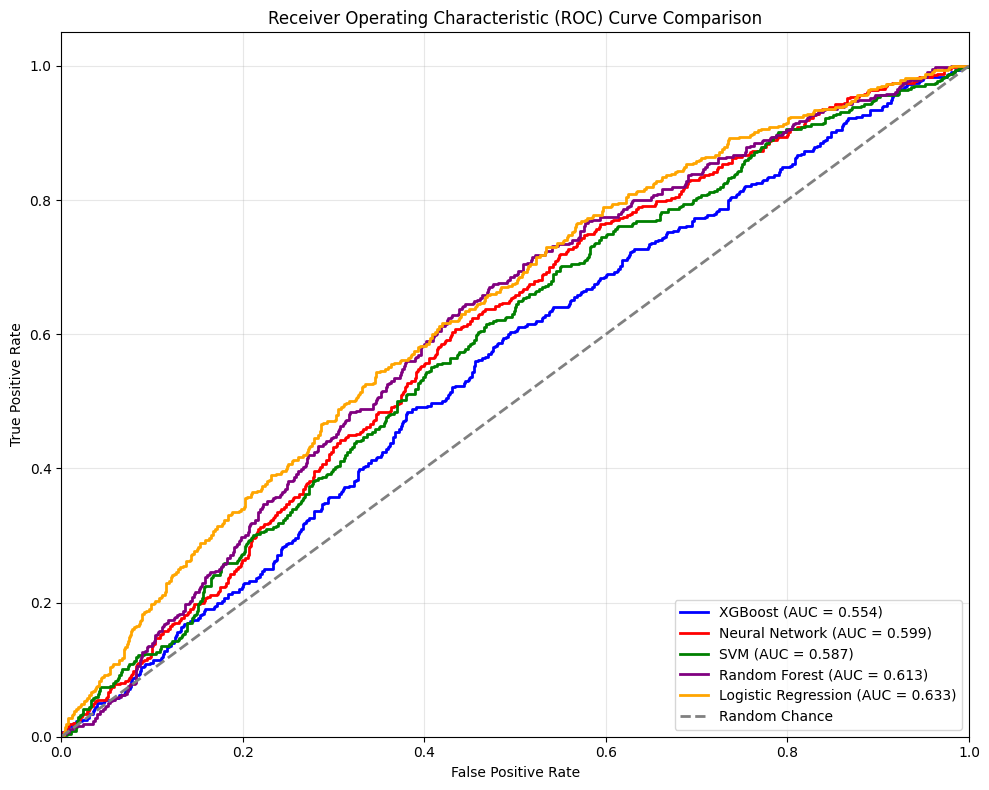

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve components for XGBoost
fpr_xgb, tpr_xgb, _ = roc_curve(y_test_binary_xgb, y_pred_prob_xgb)
roc_auc_xgb = auc(fpr_xgb, tpr_xgb)

# Calculate ROC curve components for Neural Network
fpr_nn, tpr_nn, _ = roc_curve(y_test_nn, y_pred_prob_nn)
roc_auc_nn = auc(fpr_nn, tpr_nn)

# Assuming y_pred_prob_svm is the probability output from SVM model
fpr_svm, tpr_svm, _ = roc_curve(y_test_binary_svm, y_pred_prob_svm)  # Using the SVM probability predictions
roc_auc_svm = auc(fpr_svm, tpr_svm)

#ranfom forest
fpr_rf, tpr_rf, _ = roc_curve(y_test_rf, y_proba_rf)
roc_auc_rf = auc(fpr_rf, tpr_rf)

#logistic regression
fpr_log, tpr_log, _ = roc_curve(y_true_log, y_scores_log)
roc_auc_log = auc(fpr_log, tpr_log)


# Plot all three ROC curves on the same graph
plt.figure(figsize=(10, 8))
plt.plot(fpr_xgb, tpr_xgb, color='blue', lw=2, label=f'XGBoost (AUC = {roc_auc_xgb:.3f})')
plt.plot(fpr_nn, tpr_nn, color='red', lw=2, label=f'Neural Network (AUC = {roc_auc_nn:.3f})')
plt.plot(fpr_svm, tpr_svm, color='green', lw=2, label=f'SVM (AUC = {roc_auc_svm:.3f})')
plt.plot(fpr_rf, tpr_rf, color='purple', lw=2, label=f'Random Forest (AUC = {roc_auc_rf:.3f})')
plt.plot(fpr_log, tpr_log, color='orange', lw=2, label=f'Logistic Regression (AUC = {roc_auc_log:.3f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Random Chance')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Comparison')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)

# Find the best performing model
auc_scores = [roc_auc_xgb, roc_auc_nn, roc_auc_svm]
models = ["XGBoost", "Neural Network", "SVM"]
best_model_index = auc_scores.index(max(auc_scores))
best_model = models[best_model_index]


plt.tight_layout()
plt.savefig('roc_curve_comparison.png', dpi=300)  # Save high-resolution image
plt.show()

## Conclusion

Given the AUC scores of the models, along with their respective classification reports, the Logistic Regression Model should be used to predict the Fire_Occurrence variable. With an AUC of 0.63, and a precision and recall rate for fires at 0.30 and 0.72 respectively, such a model attempts to balance Type 1 and Type 2 errors, while not entirely setting the binary predictions to 1 at all counts.